<div style="background-color: #272559; padding: 20px; text-align: center; color: white;">
    <h1>Rainfall Weather Forecasting</h1>
</div>

### Project Goal:
The primary goal of this project is to develop machine learning models for weather forecasting using historical weather data from various locations in Australia. Specifically, the project aims to achieve the following:

**Problem Statement:**

1. Rain Prediction (Binary Classification): Create a predictive model to determine whether it will rain tomorrow (RainTomorrow = Yes/No).

2. Rainfall Amount Prediction (Regression): Build a predictive model to estimate the amount of rainfall (in millimeters) expected on the following day.

By accomplishing these tasks, the project seeks to enhance the accuracy and reliability of weather predictions, providing valuable insights for individuals, businesses, and meteorological agencies.

## Table of Contents

1. [Importing Libraries](#importing-libraries)
2. [Data Acquisition](#data-acquisition)
   - a. [Data Inspection](#data-inspection)
   - b. [Data Description](#data-description)
   - c. [Understand Data Types](#understand-data-types)
3. [Duplicate Values](#duplicate-values)
4. [Missing Values](#missing-values)
5. [Statistical Analysis](#statistical-analysis)
6. [Data Visualization](#data-visualization)
   - a. [Exploring Rain Prediction](#exploring-rain-prediction)
   - b. [Exploring Rainfall Amount Prediction](#exploring-rainfall-amount-prediction)
   - c. [Exploring Categorical Columns](#exploring-categorical-columns)
   - d. [Separate Day, Month, and Year Columns from Date Column](#separate-day-month-and-year-columns-from-date-column)
   - e. [Exploring Numerical Columns](#exploring-numerical-columns)
7. [Outlier Detection & Treatment](#outlier-detection--treatment)
   - a. [Outlier Detection](#outlier-detection)
   - b. [Outlier Treatment](#outlier-treatment)
      - i. [Zscore Treatment](#zscore-treatment)
      - ii. [IQR Technique](#iqr-technique)
   - c. [Data Loss Calculation](#data-loss-calculation)
   - d. [Final Technique](#final-technique)
8. [Skewness Detection & Treatment](#skewness-detection--treatment)
9. [Encoding Categorical Columns](#encoding-categorical-columns)
10. [Correlation](#correlation)
   - a. [Correlation of All Features](#correlation-of-all-features)
      - i. [Highly Correlated Features](#highly-correlated-features)
      - ii. [Copying DataFrame for Two Problem Statements](#copying-dataframe-for-two-problem-statements)
   - b. [Correlation with First Target Rainfall Prediction](#correlation-with-first-target-rainfall-prediction)
   - c. [Correlation with Second Target Rainfall Amount](#correlation-with-second-target-rainfall-amount)
11. [Data Splitting for Features & Label](#data-splitting-for-features--label)
   - a. [Data Splitting for Rainfall Tomorrow](#data-splitting-for-rainfall-tomorrow)
   - b. [Data Splitting for Rainfall](#data-splitting-for-rainfall)
12. [Feature Scaling](#feature-scaling)
   - a. [Scaling Features for First Target (RainTomorrow)](#scaling-features-for-first-target-raintomorrow)
   - b. [Scaling Features for Second Target (Rainfall)](#scaling-features-for-second-target-rainfall)
13. [Multicollinearity](#multicollinearity)
   - a. [Multicollinearity for First Target (RainTomorrow)](#multicollinearity-for-first-target-raintomorrow)
   - b. [Multicollinearity for Second Target (Rainfall)](#multicollinearity-for-second-target-rainfall)
14. [Balance Classes](#balance-classes)
15. [Model Selection](#model-selection)
   - a. [Initiating Models for First Target](#initiating-models-for-first-target)
      - i. [Best Models with Best Random State](#best-models-with-best-random-state)
      - ii. [Best 2 Models for First Target](#best-2-models-for-first-target)
   - b. [Initiating Models for Second Target](#initiating-models-for-second-target)
      - i. [Best Models with Best Random State](#best-models-with-best-random-state)
      - ii. [Best 2 Models for Second Target](#best-2-models-for-second-target)
16. [Hyperparameter Tuning](#hyperparameter-tuning)
   - a. [Hyperparameter Tuning for First Target](#hyperparameter-tuning-for-first-target)
      - i. [ExtraTrees Classifier](#extratrees-classifier)
      - ii. [XGB Classifier](#xgb-classifier)
   - b. [Hyperparameter Tuning for Second Target](#hyperparameter-tuning-for-second-target)
      - i. [GradientBoostingRegressor](#gradientboostingregressor)
      - ii. [RandomForest Regressor](#randomforest-regressor)
17. [Choosing Best Model](#choosing-best-model)
   - a. [For First Target](#for-first-target)
      - i. [Plotting Confusion Matrix](#plotting-confusion-matrix)
      - ii. [ROC-AUC Curve](#roc-auc-curve)
   - b. [For Second Target](#for-second-target)
18. [Saving Best Model](#saving-best-model)
   - a. [Saving Model for First Target](#saving-model-for-first-target)
   - b. [Saving Model for Second Target](#saving-model-for-second-target)


<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2>1. Importing Libraries/Modules</h2>
</div>

In [1]:
# Data Analysis & Manipulation
import numpy as np
import pandas as pd

#Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Outlier Treatment, Peprocessor, Scaler
from scipy.stats import zscore
from sklearn.preprocessing import LabelEncoder, StandardScaler, PowerTransformer
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE

#Classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Regressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Lasso,Ridge, LinearRegression, SGDRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, BaggingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor

#Evaluation & Metrics
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

#Saving Model
import joblib

# Prevent WARNINGS!
import warnings
warnings.filterwarnings('ignore')

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2>2. Load the Dataset</h2>
</div>

In [2]:
# Loading Dataset
df = pd.read_csv("E:\\dataset\\dataset3-main\\weatherAUS.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


## a. Data Inspection:

In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


## b. Data Description:

In [5]:
# Checking the dimension of data
print('We have {} rows and {} columns in our dataframe'.format(*df.shape))
print('\n')
# Checking the column names in our dataframe
print('Columns in our dataframe are:\n', df.columns)

We have 8425 rows and 23 columns in our dataframe


Columns in our dataframe are:
 Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')


## c. Understand Data Types:

In [6]:
# Checking data datatypes
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [7]:
# Understanding data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

### `Observations:`

* Our dataframe comprises 8425 rows and 23 columns.
* The name of the columns and their meanings are mentioned below:
| Feature      | Description   |
|:-------------|:-------------------------------|
| Date             | The date of observation.                                   |
| Location          | The common name of the weather station.                   |
| MinTemp          | The minimum temperature in degrees Celsius.                |
| MaxTemp          | The maximum temperature in degrees Celsius.                |
| Rainfall         | The amount of rainfall recorded for the day (mm).         |
| Evaporation      | Class A pan evaporation in mm in the 24 hours to 9 am.     |
| Sunshine         | Number of hours of bright sunshine in the day.            |
| WindGustDir      | Direction of the strongest wind gust in the 24 hours to midnight. |
| WindGustSpeed    | Speed (km/h) of the strongest wind gust in the 24 hours to midnight. |
| WindDir9am       | Wind direction at 9 am.                                    |
| WindDir3pm       | Wind direction at 3 pm.                                    |
| WindSpeed9am     | Wind speed (km/hr) averaged over 10 minutes prior to 9 am. |
| WindSpeed3pm     | Wind speed (km/hr) averaged over 10 minutes prior to 3 pm. |
| Humidity9am      | Humidity (percent) at 9 am.                               |
| Humidity3pm      | Humidity (percent) at 3 pm.                               |
| Pressure9am      | Atmospheric pressure (hPa) reduced to mean sea level at 9 am. |
| Pressure3pm      | Atmospheric pressure (hPa) reduced to mean sea level at 3 pm. |
| Cloud9am         | Fraction of sky obscured by cloud at 9 am.                |
| Cloud3pm         | Fraction of sky obscured by cloud at 3 pm.                |
| Temp9am          | Temperature (degrees C) at 9 am.                          |
| Temp3pm          | Temperature (degrees C) at 3 pm.                          |
| RainToday        | Boolean: 1 if precipitation (mm) in the 24 hours to 9 am exceeds 1 mm, otherwise 0. |
| RainTomorrow     | Amount of next day rain in mm; used for classification and regression tasks. |
* The dataframe contains two datatypes: 16 columns has float values and 7 columns has object values.
*  we can clearly see the their are missingvalues in out dataframe.
*  Memory Usage: 1.5+ MB

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2>3. Duplicate Values Analysis & Treatment</h2>
</div>

In [8]:
# Duplicate Values in our Dataframe
print("Total Duplicate Values in our Dataframe are: ", df.duplicated().sum())

Total Duplicate Values in our Dataframe are:  1663


In [9]:
#Dropping Duplocate values
df.drop_duplicates(keep='last', inplace=True)

In [10]:
# After dropping Duplicate Values checking again
print("Total Duplicate Values in our Dataframe are: ", df.duplicated().sum())

Total Duplicate Values in our Dataframe are:  0


In [11]:
#Checking the dimension of our dataframe
df.shape

(6762, 23)

### `Observations:`
* Our initial dataframe had 1663 duplicate values.
* To address this issue, we removed the duplicate values by dropping the corresponding rows or columns.
* As a result of this data cleaning process, there are no remaining duplicate values in the dataframe.
* The dimensions of our current dataframe are 6762 rows and 23 columns.

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2>4. Missing Values Detection & Treatment</h2>
</div>

## a. Missing Values Detection

In [12]:
#Checking Missing Values
print("Total Missing Values in our Dataframe are: ", df.isnull().sum().sum())
print('\n')

# Checking for Missing values
missing_values = df.isnull().sum().sort_values(ascending = False)
percentage_missing_values =(missing_values/len(df))*100
print(pd.concat([missing_values, percentage_missing_values], axis =1, keys =['Missing Values', '% Missing data']))

Total Missing Values in our Dataframe are:  16513


               Missing Values  % Missing data
Sunshine                 3236       47.855664
Evaporation              2921       43.197279
Cloud3pm                 1902       28.127773
Cloud9am                 1866       27.595386
Pressure3pm              1311       19.387755
Pressure9am              1308       19.343390
WindGustDir               942       13.930790
WindGustSpeed             942       13.930790
WindDir9am                794       11.742088
WindDir3pm                294        4.347826
Rainfall                  138        2.040816
RainToday                 138        2.040816
RainTomorrow              138        2.040816
WindSpeed3pm              100        1.478852
Humidity3pm                96        1.419698
Temp3pm                    92        1.360544
MinTemp                    70        1.035197
WindSpeed9am               63        0.931677
MaxTemp                    57        0.842946
Humidity9am                5

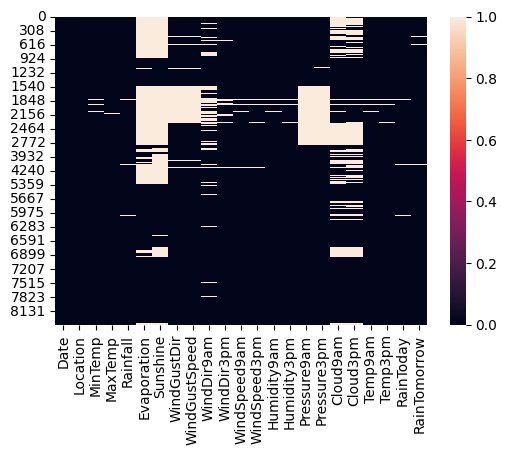

In [13]:
#Visualizing it
plt.figure(figsize=(6,4))
sns.heatmap(df.isnull())
plt.show()

### Seperating Categorical & Numerical columns:

In [14]:
# Separating Numerical & Categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
numerical_columns = df.select_dtypes(include=['float64']).columns

print('Categorical columns are: ',categorical_columns)
print('\n')
print('Numerical_columns are: ',numerical_columns)

Categorical columns are:  Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')


Numerical_columns are:  Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')


In [15]:
# Checking missing values in Categorical columns
df[categorical_columns].isnull().sum()

Date              0
Location          0
WindGustDir     942
WindDir9am      794
WindDir3pm      294
RainToday       138
RainTomorrow    138
dtype: int64

In [16]:
# Checking missing values in Numerical columns
df[numerical_columns].isnull().sum()

MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustSpeed     942
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
dtype: int64

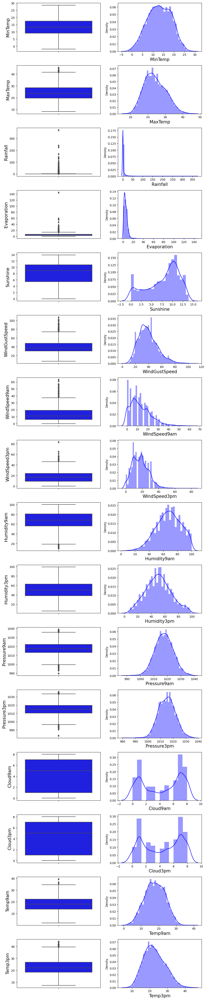

In [17]:
# Visualizing Numerical columns befor missing value imputation
plt.figure(figsize=(10, 3 * len(numerical_columns)))

# Loop through each numerical column and create plots
for i, column in enumerate(numerical_columns):
    plt.subplot(len(numerical_columns), 2, 2 * i + 1)
    sns.boxplot(y=column, data=df, color='blue')
    plt.ylabel(column, fontsize=15)
    
    plt.subplot(len(numerical_columns), 2, 2 * i + 2)
    sns.distplot(df[column], color='blue')
    plt.xlabel(column, fontsize=15)

plt.tight_layout()
plt.show()

## Missing Value imputation or Treatment

In [18]:
# Imputation techniques
impute_techniques = {
    'MinTemp': 'mean',
    'MaxTemp': 'median',
    'Rainfall': 'median',
    'Evaporation': 'median',
    'Sunshine': 'mean',
    'WindGustSpeed': 'median',
    'WindSpeed9am': 'median',
    'WindSpeed3pm':'median',
    'Humidity9am': 'median',
    'Humidity3pm': 'mean',
    'Pressure9am': 'median',
    'Pressure3pm': 'median',
    'Cloud9am': 'mean',
    'Cloud3pm': 'mean',
    'Temp9am': 'median',
    'Temp3pm': 'median',
    'WindGustDir' : 'mode',
    'WindDir9am' : 'mode',
    'WindDir3pm' : 'mode',
    'RainToday' : 'mode',
    'RainTomorrow' : 'mode'   
}

# Impute based on defined techniques
for column, technique in impute_techniques.items():
    if technique == 'mode':
        mode_value = df[column].mode()[0]
        df[column].fillna(mode_value, inplace=True)
    elif technique == 'mean':
        mean_value = df[column].mean()
        df[column].fillna(mean_value, inplace=True)
    elif technique == 'median':
        median_value = df[column].median()
        df[column].fillna(median_value, inplace=True)

df.sample(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
4084,2016-12-03,Williamtown,21.3,26.5,0.0,4.6,7.890896,S,41.0,S,...,72.0,57.0,1015.8,1014.4,8.000000,1.000000,23.1,24.7,No,No
572,2010-06-26,Albury,6.2,12.1,10.2,4.6,7.890896,WNW,35.0,WNW,...,86.0,71.0,1020.5,1020.5,7.000000,8.000000,7.6,11.1,Yes,No
7387,2012-03-27,PerthAirport,10.0,27.7,0.0,5.4,10.800000,SW,39.0,SSW,...,64.0,36.0,1018.3,1016.2,0.000000,0.000000,20.0,26.3,No,No
5434,2010-01-16,Melbourne,16.9,33.1,0.0,8.0,12.300000,SW,56.0,NNE,...,81.0,62.0,1008.3,1006.2,2.000000,6.000000,18.7,24.4,No,No
2449,2014-09-06,Penrith,11.2,17.4,1.2,4.6,7.890896,SE,33.0,SSW,...,64.0,65.0,1017.6,1015.1,4.336806,4.320988,15.0,15.9,Yes,Yes


In [19]:
# Checking missing values are imputation
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

### `Observations:`

**Total Missing Values in the Dataframe:** There are a total of 16,513 missing values in the dataset.

* **Missing Values and Percentages:** Several features have missing values, and the extent of missing data varies. The feature "Sunshine" has the highest percentage of missing values, accounting for 47.86% of the missing data. "Evaporation" follows closely with 43.20% missing data, and "Cloud3pm" and "Cloud9am" have 28.13% and 27.60% missing values, respectively. Other features with substantial missing data include "Pressure3pm" (19.39%), "Pressure9am" (19.34%), "WindGustDir" (13.93%), and "WindGustSpeed" (13.93%).
<br>
<br>
* **Categorical Columns with Missing Values:** There are five categorical columns with missing values. "WindGustDir" has 942 missing values, "WindDir9am" has 794 missing values, "WindDir3pm" has 294 missing values, and both "RainToday" and "RainTomorrow" have 138 missing values each.
<br>
<br>
* **Numerical Columns with Missing Values:** Numerous numerical columns have missing values. "MinTemp" has 70 missing values, "MaxTemp" has 57, and "Rainfall" has 138 missing values. Additionally, "Evaporation" has 2,921 missing values, "Sunshine" has 3,236, "WindGustSpeed" has 942, "WindSpeed9am" has 63, "WindSpeed3pm" has 100, "Humidity9am" has 54, "Humidity3pm" has 96, "Pressure9am" has 1,308, "Pressure3pm" has 1,311, "Cloud9am" has 1,866, "Cloud3pm" has 1,902, "Temp9am" has 51, and "Temp3pm" has 92 missing values.
<br>
<br>

**Imputation Techniques:** To address the missing values, various imputation techniques were employed. For numerical columns with outliers such as "MinTemp," "MaxTemp," "Rainfall," "Evaporation," "Sunshine," "WindGustSpeed," "WindSpeed9am," "WindSpeed3pm," "Humidity9am," "Pressure9am," "Pressure3pm," "Cloud9am," "Cloud3pm," "Temp9am," and "Temp3pm," median imputation was used due to the presence of outliers. For numerical columns without outliers such as "Sunshine" and "Humidity3pm," mean imputation was applied. For categorical columns including "WindGustDir," "WindDir9am," "WindDir3pm," "RainToday," and "RainTomorrow," mode imputation was utilized. These imputation techniques were chosen based on the specific characteristics of each feature, with median used to handle outliers and mean for features without outliers. Mode imputation was applied to categorical features for which it made sense.

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2>5. Statistical Analysis</h2>
</div>

In [20]:
# Statistical Summary
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6762.000000,6762.000000,6762.000000,6762.00000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.109145,24.093301,2.723410,4.99898,7.890896,38.702159,12.765602,17.562703,67.510500,50.467147,1017.621222,1015.116060,4.336806,4.320988,17.895830,22.700281
std,5.540667,6.130367,10.490138,3.36177,2.733639,13.393977,9.789075,9.548883,17.182756,18.498341,6.027923,5.967643,2.474649,2.323276,5.722418,5.972262
min,-2.000000,8.200000,0.000000,0.00000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.600000,0.000000,4.00000,7.890896,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000
50%,13.109145,23.500000,0.000000,4.60000,7.890896,37.000000,11.000000,17.000000,68.000000,50.000000,1017.600000,1015.100000,4.336806,4.320988,18.000000,22.100000
75%,17.400000,28.400000,0.800000,5.00000,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.00000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


### `Observations:`

**MinTemp:**
The "MinTemp" column, which records the minimum temperature in degrees Celsius, has a count of 6762 records. The mean minimum temperature is approximately 13.11 degrees Celsius, with a standard deviation of approximately 5.54 degrees Celsius. The temperature range varies from a minimum of -2.0 degrees Celsius to a maximum of 28.5 degrees Celsius. The 25th percentile temperature is 9.0 degrees Celsius, indicating that 25% of the data falls below this value, while the 75th percentile temperature is 17.4 degrees Celsius, indicating that 75% of the data falls below this value.

**MaxTemp:**
In the "MaxTemp" column, which records the maximum temperature in degrees Celsius, there are 6762 records. The mean maximum temperature is approximately 24.09 degrees Celsius, with a standard deviation of approximately 6.13 degrees Celsius. The temperature range varies from a minimum of 8.2 degrees Celsius to a maximum of 45.5 degrees Celsius. The 25th percentile maximum temperature is 19.6 degrees Celsius, and the 75th percentile temperature is 28.4 degrees Celsius.

**Rainfall:**
The "Rainfall" column, representing the amount of rainfall recorded in millimeters (mm), has 6762 records. The mean rainfall is approximately 2.72 mm, with a standard deviation of about 10.49 mm. The range of rainfall values varies from a minimum of 0.0 mm to a maximum of 371.0 mm. The 25th percentile indicates that 25% of the data has zero rainfall, while the 75th percentile shows a value of 0.8 mm.

**Evaporation:**
In the "Evaporation" column, which records the Class A pan evaporation in millimeters (mm), there are 6762 records. The mean evaporation is approximately 4.99 mm, with a standard deviation of about 3.36 mm. The range of evaporation values varies from a minimum of 0.0 mm to a maximum of 145.0 mm. The 25th percentile shows an evaporation value of 4.0 mm, and the 75th percentile has a value of 5.0 mm.

**Sunshine:**
The "Sunshine" column, representing the number of hours of bright sunshine in a day, contains 6762 records. The mean sunshine duration is approximately 7.89 hours, with a standard deviation of about 2.73 hours. The data indicates a minimum sunshine duration of 0.0 hours, with the 25th and 75th percentiles also reporting values of 7.89 hours.

**WindGustSpeed:**
The "WindGustSpeed" column, which records the speed of the strongest wind gust in kilometers per hour (km/h), has 6762 records. The mean wind gust speed is approximately 38.70 km/h, with a standard deviation of about 13.39 km/h. The range of wind gust speeds varies from a minimum of 7.0 km/h to a maximum of 107.0 km/h. The 25th percentile shows a wind gust speed of 30.0 km/h, while the 75th percentile has a value of 46.0 km/h.

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2>6. Data Visualization</h2>
</div>

## a. Exploring of our target columns: (Rain Prediction)

In [21]:
# Calculate value counts for our target
value_counts = df.RainTomorrow.value_counts()

# Calculate percentages
percentages = (value_counts / len(df)) * 100

# Combine value counts and percentages into a DataFrame
Rainfall = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})

# Print the result DataFrame
print(Rainfall)

     Count  Percentage
No    5190    76.75244
Yes   1572    23.24756


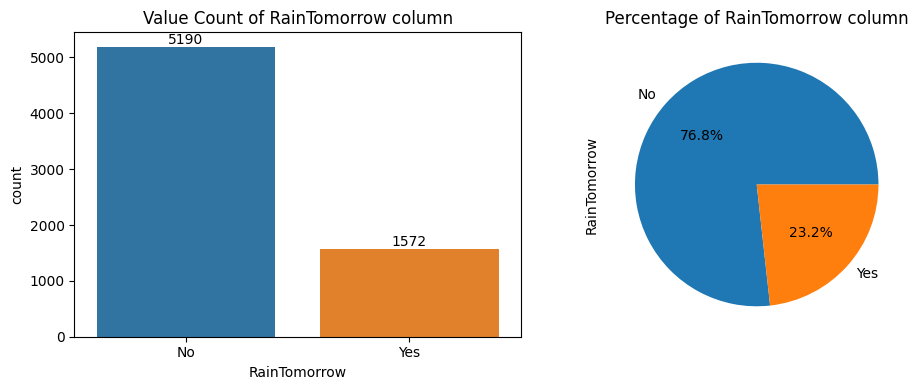

In [22]:
# Visualizing it:
fig, axes = plt.subplots(1,2,figsize=(10,4))

# First plot: Value count of the column using count plot
ax = sns.countplot(x='RainTomorrow', data=df, ax=axes[0])
for container in ax.containers:
    ax.bar_label(container)
axes[0].set_title('Value Count of RainTomorrow column')

# Second plot: Percentage of RainTomorrow column
df['RainTomorrow'].value_counts().plot(kind="pie", autopct="%0.1f%%", ax=axes[1])
axes[1].set_title('Percentage of RainTomorrow column')

plt.tight_layout()
plt.show()

### `Observation:` 

The "RainTomorrow" column represents whether it will rain tomorrow, with two possible values: "No" and "Yes." Among the 6762 records, "No" occurs 5190 times, accounting for approximately 76.75% of the data, while "Yes" appears 1572 times, representing approximately 23.25% of the data. This distribution of values indicates that the dataset is imbalanced, with a significant majority of instances indicating a "No" for rain tomorrow, making up the majority of the data. Data imbalance can impact the performance of machine learning models and may require techniques such as oversampling, undersampling, or the use of appropriate evaluation metrics to address the imbalance during model development and evaluation.

## b. Exploring of our target columns: (Rainfall Amount Prediction)

In [23]:
df.Rainfall.value_counts()

0.0      4472
0.2       321
0.4       144
0.6        87
1.2        69
         ... 
73.8        1
23.8        1
61.2        1
128.0       1
40.0        1
Name: Rainfall, Length: 250, dtype: int64

In [24]:
# finding details about minimum and maximum Rainfall amount
print('Minimum Capacity of Rainfall amount:',df.Rainfall.min())
print('Maximum Capacity of Rainfall amount:',df.Rainfall.max())

Minimum Capacity of Rainfall amount: 0.0
Maximum Capacity of Rainfall amount: 371.0


In [25]:
# checking Smallest & Biggest Powerplant in our dataframe
df.loc[(df['Rainfall'] == 371.0)]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
1149,2009-11-07,CoffsHarbour,17.4,23.1,371.0,4.6,3.5,E,37.0,SW,...,93.0,81.0,1026.6,1025.9,8.0,5.0,18.6,22.0,Yes,Yes


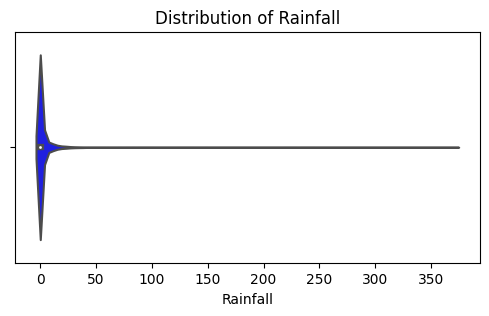

In [26]:
# Visualizing It
plt.figure(figsize=(6,3))
sns.violinplot(x='Rainfall', data=df, color='blue')
plt.title('Distribution of Rainfall')
plt.show()

In [27]:
df.loc[df.Rainfall >25].shape

(160, 23)

### `Observations:`

The "Rainfall" column represents the amount of rainfall recorded in millimeters (mm). The data includes a range of rainfall amounts, with varying frequencies of occurrence. The most common rainfall amount in the dataset is 0.0 mm, which appears 4472 times, indicating that no rainfall was recorded on those days. 

The dataset also includes various other rainfall amounts, such as 0.2 mm (321 occurrences), 0.4 mm (144 occurrences), 0.6 mm (87 occurrences), and 1.2 mm (69 occurrences), among others. 

The maximum recorded rainfall amount in the dataset is 371.0 mm, and this value occurs only once. Additionally, it's interesting to note that rainfall amounts greater than 25 mm occurred 160 times in the dataset.

This information provides an overview of the distribution of rainfall amounts in the dataset, highlighting the most frequent occurrence of no rainfall (0.0 mm) and the presence of rare, high rainfall values, such as 371.0 mm.

## c. Exploring all the categorical columns

In [28]:
for i in categorical_columns[:-1]:
    counts = df[i].value_counts()
    percentage = (counts / len(df)) * 100
    print(f"Column Name: {i}")
    print(pd.concat([counts, percentage], axis =1, keys =['Values', 'Percentage']))
    print('='*50)

Column Name: Date
            Values  Percentage
2011-02-11       4    0.059154
2011-02-18       4    0.059154
2011-03-18       4    0.059154
2011-03-19       4    0.059154
2011-03-20       4    0.059154
...            ...         ...
2016-11-03       1    0.014789
2016-11-02       1    0.014789
2016-11-01       1    0.014789
2016-10-31       1    0.014789
2013-06-08       1    0.014789

[3004 rows x 2 columns]
Column Name: Location
              Values  Percentage
PerthAirport    1204   17.805383
Albury           907   13.413191
Newcastle        822   12.156167
Melbourne        811   11.993493
Williamtown      615    9.094942
CoffsHarbour     611    9.035788
Brisbane         579    8.562555
Penrith          482    7.128069
Darwin           250    3.697131
Wollongong       237    3.504880
Adelaide         205    3.031647
Uluru             39    0.576752
Column Name: WindGustDir
     Values  Percentage
E      1460   21.591245
SW      465    6.876664
N       459    6.787933
W       434  

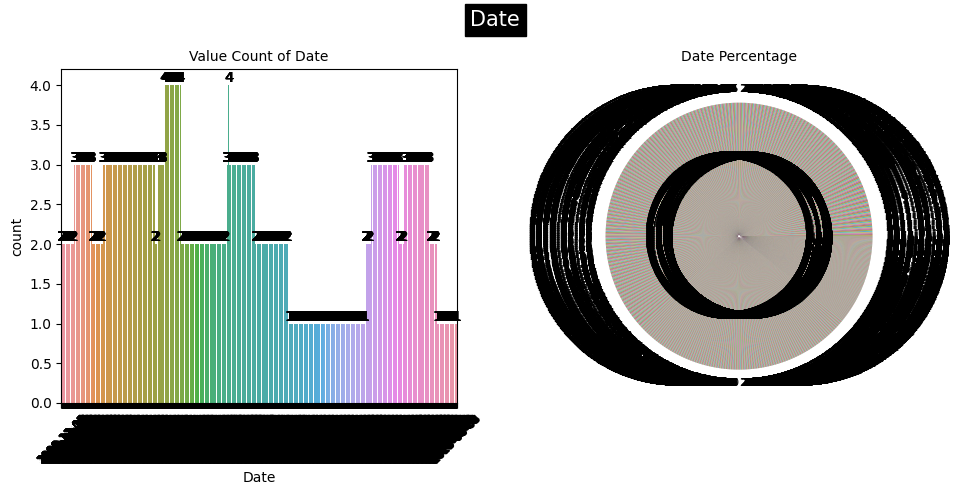

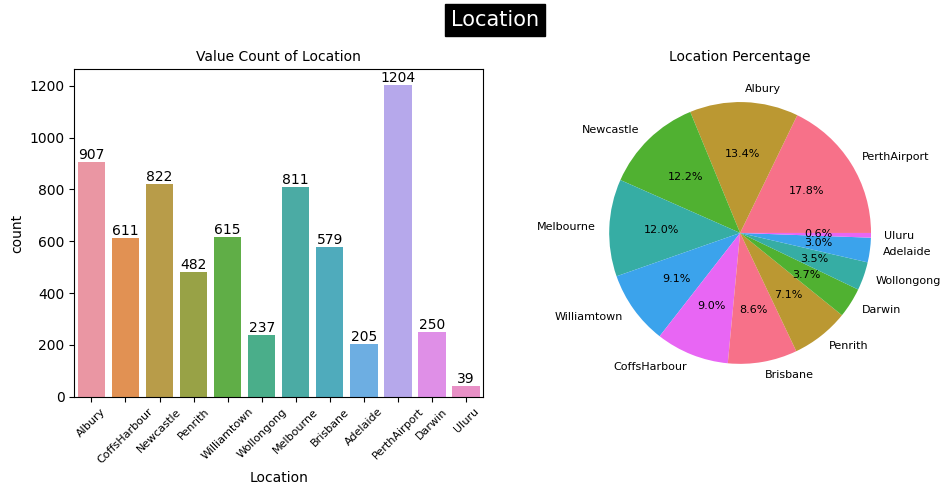

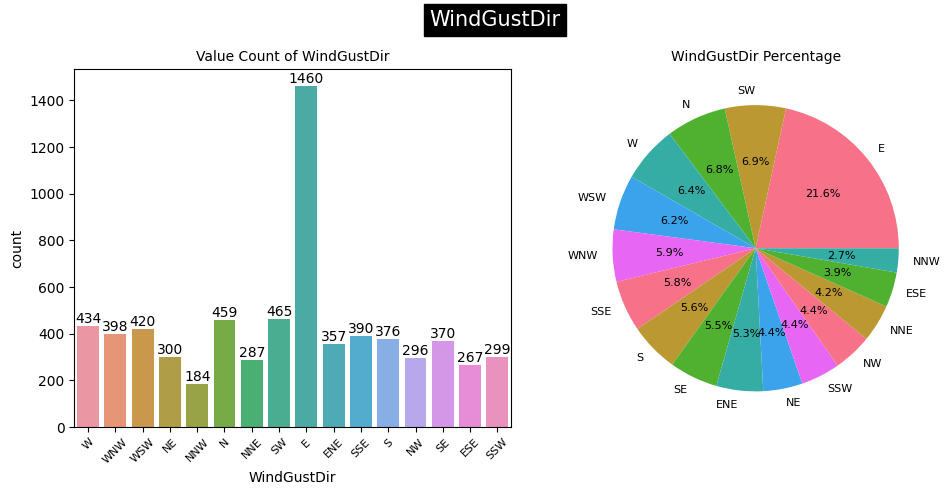

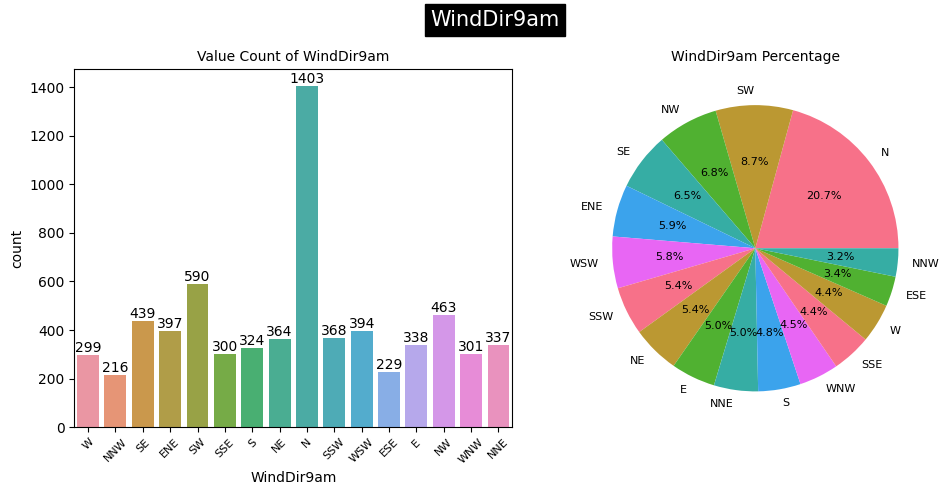

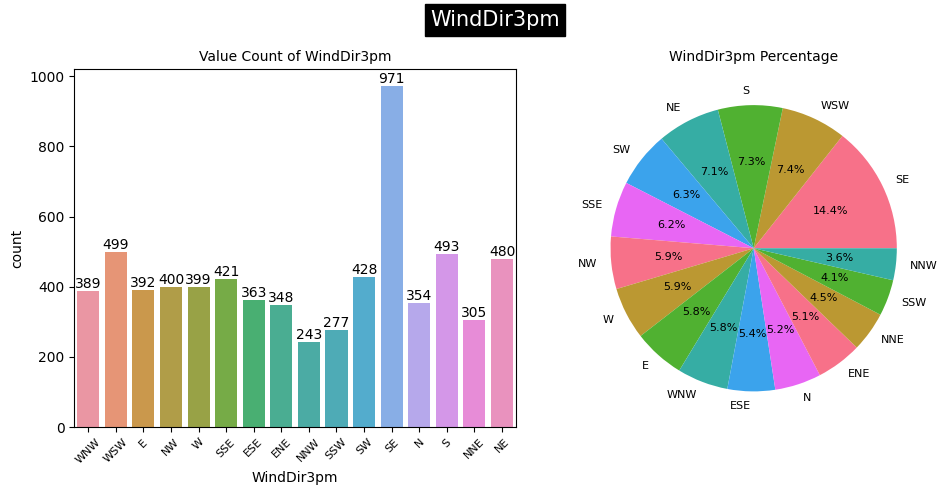

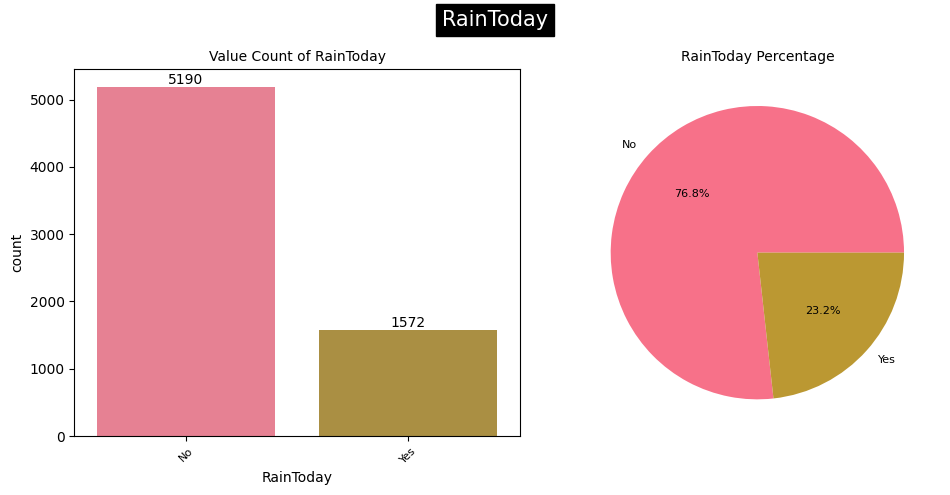

In [29]:
#Visualizing it
cat_col = categorical_columns[:-1]

#Iterate over Categorical column
for i, column in enumerate(cat_col):
    
    fig, axes = plt.subplots(1, 2, figsize=(10,5))
    sns.set_palette("husl")
    
    # Plot the countplot
    ax = sns.countplot(x=column, data=df, ax=axes[0])
    for container in ax.containers:
        ax.bar_label(container)
    ax.set_title(f'Value Count of {column}', fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=8)

    # Plot the pie chart
    column_counts = df[column].value_counts()
    ax = axes[1]
    ax.pie(column_counts, labels=column_counts.index, autopct='%0.1f%%', textprops={'fontsize': 8})
    ax.set_title(f'{column} Percentage', fontsize=10)
    
    fig.suptitle(column, fontsize=15, backgroundcolor='black',color='white')
    plt.tight_layout()
    plt.show()

### `Observations:`

* **Location**
- The "Location" column contains information about the location where weather data was recorded.
- The most common location is "PerthAirport" with 17.81% of the data.
- Other significant locations include "Albury," "Newcastle," and "Melbourne."

* **WindGustDir**
- The "WindGustDir" column represents the direction from which the strongest wind gust was recorded.
- "E" (East) is the most frequent direction with 21.59% of the data.
- Other common wind gust directions include "SW," "N," and "W."

* **WindDir9am**
- "WindDir9am" indicates the wind direction at 9 AM.
- "N" (North) is the most prevalent direction, accounting for 20.75% of the data.
- Other notable directions are "SW," "NW," and "SE."

* **WindDir3pm**
- The "WindDir3pm" column represents the wind direction at 3 PM.
- "SE" (Southeast) is the dominant direction, comprising 14.36% of the data.
- Other significant wind directions include "WSW," "S," and "NE."

* **RainToday**
- "RainToday" is a binary column indicating whether it rained on a particular day.
- "No" is the more common category, with 76.75% of the data, suggesting many days without rain.
- "Yes" represents days with rain, constituting 23.25% of the data.

* **Date**
- The "Date" column contains date values.
- There are 3004 unique dates in the dataset.
- The percentage for each date is relatively low, indicating a diverse range of dates with relatively uniform distribution. - -- However, we will make the column in datetime format and try to get more insights on it.

### d. Date column to Separate Day, Month and Year Columns

In [30]:
# Converting Date datatypes and spliting date into date, month and year.
df['Date']=pd.to_datetime(df['Date'])
df['Day']=df['Date'].apply(lambda x:x.day)
df['Month']=df['Date'].apply(lambda x:x.month)
df['Year']=df['Date'].apply(lambda x:x.year)

# Dropping date column
df.drop('Date', axis=1, inplace = True)

#checking dataframe
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,4.6,7.890896,W,44.0,W,WNW,...,1007.1,8.000000,4.320988,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,4.6,7.890896,WNW,44.0,NNW,WSW,...,1007.8,4.336806,4.320988,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,4.6,7.890896,WSW,46.0,W,WSW,...,1008.7,4.336806,2.000000,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,4.6,7.890896,NE,24.0,SE,E,...,1012.8,4.336806,4.320988,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,4.6,7.890896,W,41.0,ENE,NW,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008


In [31]:
# Removing Date column from categorical columns
categorical_columns=categorical_columns.drop('Date')
categorical_columns

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow'],
      dtype='object')

In [32]:
#updated Day, Month and Year column in numerical columns
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year'],
      dtype='object')

### e. Exploring Numerical Columns

In [33]:
for i in numerical_columns:
    counts = df[i].value_counts()
    percentage = (counts / len(df)) * 100
    print(f"Column Name: {i}")
    print(pd.concat([counts, percentage], axis =1, keys =['Values', 'Percentage']))
    print('='*50)

Column Name: MinTemp
            Values  Percentage
 13.109145      70    1.035197
 13.200000      58    0.857734
 12.000000      57    0.842946
 14.800000      53    0.783792
 12.700000      53    0.783792
...            ...         ...
-1.200000        1    0.014789
-1.500000        1    0.014789
-1.700000        1    0.014789
-0.800000        1    0.014789
 26.000000       1    0.014789

[286 rows x 2 columns]
Column Name: MaxTemp
      Values  Percentage
23.5      99    1.464064
19.0      66    0.976043
19.8      62    0.916888
22.3      54    0.798580
23.8      54    0.798580
...      ...         ...
38.9       1    0.014789
10.3       1    0.014789
9.4        1    0.014789
42.5       1    0.014789
43.5       1    0.014789

[331 rows x 2 columns]
Column Name: Rainfall
       Values  Percentage
0.0      4472   66.134280
0.2       321    4.747116
0.4       144    2.129547
0.6        87    1.286602
1.2        69    1.020408
...       ...         ...
73.8        1    0.014789
23.8    

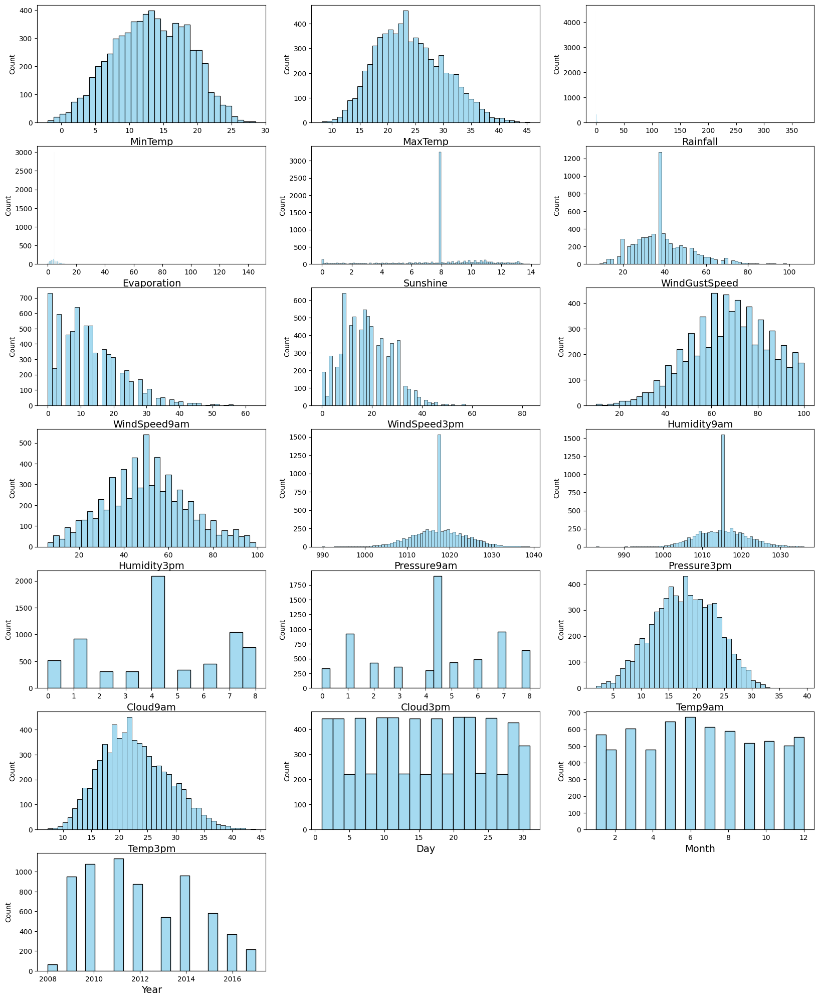

In [34]:
#Visiualizing it using Histogram
plt.figure(figsize=(20,25), facecolor='white')
plotnumber =1
for column in numerical_columns:
    if plotnumber <=20:
        ax = plt.subplot(7,3,plotnumber)
        sns.histplot(df[column], color='skyblue')
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.show()

### `Observations:`

* **MinTemp:**
- The most common minimum temperature observed is approximately 13.11°C, making up about 1.04% of the data.
- There is a wide range of minimum temperatures, with the lowest being around -1.7°C and the highest at 26°C.
- The data in this column appears to be fairly evenly distributed, with a variety of temperature values.

* **MaxTemp:**
- The most common maximum temperature observed is around 23.5°C, accounting for about 1.46% of the data.
- Maximum temperatures vary, with the lowest around 9.4°C and the highest around 43.5°C.
- The distribution of maximum temperatures is relatively uniform, with a wide range of values.

* **Rainfall:**
- The majority of days have no rainfall (0.0 mm), making up approximately 66.13% of the data.
- Rainfall amounts vary, with the highest recorded at 128.0 mm.
- The distribution of rainfall data is highly skewed toward lower values, indicating that many days have minimal or no rainfall.

* **Evaporation:**
- Evaporation levels of around 4.6 mm are the most common, accounting for about 44.51% of the data.
- There is some variation in evaporation levels, with the highest observed at 145.0 mm.
- The distribution of evaporation data is skewed, with a concentration of values around 4.6 mm.

* **Sunshine:**
- The most common sunshine duration is approximately 7.89 hours, making up about 47.86% of the data.
- Sunshine duration varies, with some days having no sunshine (0.0 hours) and others having up to 13.9 hours.
- The data is skewed towards higher sunshine durations, with most days having moderate to high levels of sunshine.

* **WindGustSpeed:**
- Wind gust speeds of 37.0 km/h are the most common, accounting for about 18.84% of the data.
- Wind gust speeds vary, with the highest observed at 107.0 km/h.
- The distribution of wind gust speeds is somewhat skewed, with a concentration around 37.0 km/h.

* **WindSpeed9am:**
- Wind speeds of 0.0 km/h at 9 am are the most common, making up approximately 10.80% of the data.
- Wind speeds vary, with the highest recorded at 63.0 km/h.
- The distribution of wind speeds at 9 am is somewhat skewed, with a concentration of lower values.

* **WindSpeed3pm:**
- Wind speeds of 9.0 km/h at 3 pm are the most common, accounting for about 9.45% of the data.
- Wind speeds vary, with the highest observed at 83.0 km/h.
- The distribution of wind speeds at 3 pm is somewhat skewed, with a concentration around 9.0 km/h.

* **Humidity9am:**
- Humidity levels of 68.0% at 9 am are the most common, making up approximately 3.21% of the data.
- Humidity levels vary, with the lowest recorded at 10.0%.
- The distribution of humidity levels at 9 am is somewhat skewed, with a concentration around 68.0%.

* **Humidity3pm:**
- Humidity levels of 46.0% at 3 pm are the most common, accounting for about 2.32% of the data.
- Humidity levels vary, with the highest recorded at 99.0%.
- The distribution of humidity levels at 3 pm is somewhat skewed, with a concentration around 46.0%.

* **Pressure9am:**
- The most common pressure level at 9 am is approximately 1017.6 hPa, making up about 19.80% of the data.
- Pressure levels vary, with the highest recorded at 1036.2 hPa.
- The distribution of pressure levels at 9 am is somewhat skewed, with a concentration around 1017.6 hPa.

* **Pressure3pm:**
- Pressure levels around 1015.1 hPa at 3 pm are the most common, accounting for about 19.92% of the data.
- Pressure levels vary, with the highest recorded at 1035.9 hPa.
- The distribution of pressure levels at 3 pm is somewhat skewed, with a concentration around 1015.1 hPa.

* **Cloud9am:**
- Cloud cover of approximately 4.34 oktas at 9 am is the most common, making up about 27.60% of the data.
- Cloud cover varies, with levels ranging from 0.0 to 8.0 oktas.
- The distribution of cloud cover at 9 am is somewhat skewed, with a concentration around 4.34 oktas.

* **Cloud3pm:**
- Cloud cover of approximately 4.32 oktas at 3 pm is the most common, accounting for about 28.13% of the data.
- Cloud cover levels vary, with levels ranging from 0.0 to 8.0 oktas.
- The distribution of cloud cover at 3 pm is somewhat skewed, with a concentration around 4.32 oktas.

* **Temp9am:**
- The most common temperature at 9 am is approximately 18.0°C, making up about 1.66% of the data.
- Temperatures vary, with the lowest recorded at 2.0°C and the highest at 30.2°C.
- The distribution of temperatures at 9 am is relatively uniform, with a wide range of values.

* **Temp3pm:**
- The most common temperature at 3 pm is around 22.1°C, accounting for about 1.88% of the data.
- Temperatures vary, with the lowest recorded at 38.0°C and the highest at 42.4°C.
- The distribution of temperatures at 3 pm is relatively uniform, with a wide range of values.

* **Day:**
- Days of the month are quite evenly distributed, with various dates appearing frequently in the data.
- No specific date stands out as the most common, and the distribution of days is relatively uniform.

* **Month:**
- The data spans multiple months, with June (month 6) and May (month 5) being the most frequently recorded months.
- The distribution of months in the dataset is not uniform, indicating seasonal variations.

* **Year:**
- The data covers multiple years, with 2011 being the most common year.
- The distribution of years in the dataset is not uniform, suggesting potential changes over the years.

## b. Bivariate Analysis

### i.  comparing All categorical columns with our first target Rain Prediction

In [35]:
cat_col = categorical_columns[:-1]

# Iterate through each categorical column
for col in cat_col:
    
    # Group by 'Income' and the current categorical column
    Income_counts = df.groupby(['RainTomorrow', col])[col].count()
    
    # Calculate the total count for each category in the current column
    total_counts = df.groupby(col)['RainTomorrow'].count()
    
    # Calculate the percentage of 'Income' for each category in the current column
    Income_percentages = (Income_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    Income_df = pd.concat([Income_counts, Income_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(Income_df)
    print('*'*60)

                           Count  Percentage
RainTomorrow Location                       
No           Adelaide        160       78.05
             Albury          708       78.06
             Brisbane        444       76.68
             CoffsHarbour    425       69.56
             Darwin          218       87.20
             Melbourne       608       74.97
             Newcastle       624       75.91
             Penrith         366       75.93
             PerthAirport    962       79.90
             Uluru            39      100.00
             Williamtown     462       75.12
             Wollongong      174       73.42
Yes          Adelaide         45       21.95
             Albury          199       21.94
             Brisbane        135       23.32
             CoffsHarbour    186       30.44
             Darwin           32       12.80
             Melbourne       203       25.03
             Newcastle       198       24.09
             Penrith         116       24.07
          

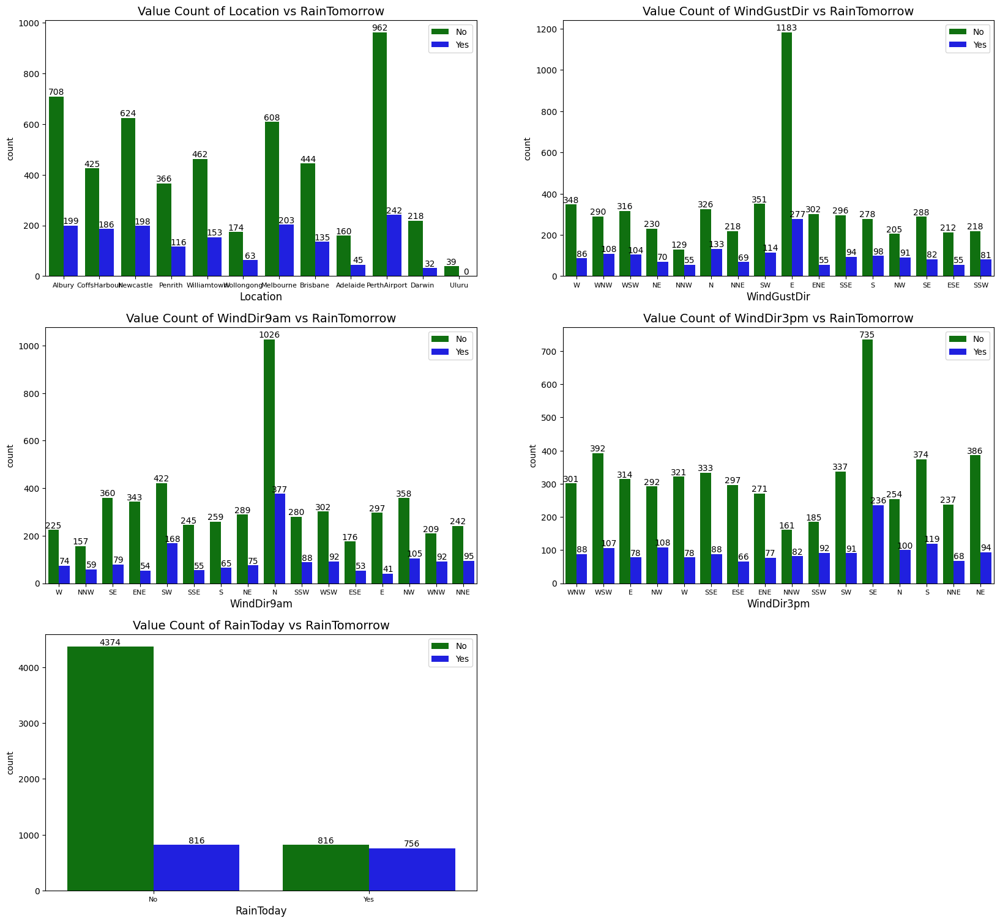

In [36]:
# Visualization of Categorical column Vs RainTomorrow
plt.figure(figsize=(20,25))
p=1

for i in cat_col:
    if p<=8:
        plt.subplot(4,2,p)
        custom_palette = {"Yes": "Blue", "No": "green"}
        ax= sns.countplot(x=i, hue='RainTomorrow',data=df, palette=custom_palette)
        for container in ax.containers:
            ax.bar_label(container)
        plt.title(f'Value Count of {i} vs RainTomorrow', fontsize=14)
        plt.xlabel(i, fontsize=12)
        plt.xticks(fontsize=8)
        plt.legend()
    p+=1
plt.show()

### `Observations:`

1. **RainTomorrow vs. Location:**
   - For 'No' in 'RainTomorrow' (No rain forecast):
     - Locations like 'Adelaide', 'Albury', 'Brisbane', 'CoffsHarbour', 'Melbourne', 'Newcastle', 'Penrith', 'PerthAirport', and 'Williamtown' have relatively high percentages (ranging from around 69% to 78%) of no rain forecast.
     - 'Uluru' stands out with 100% of no rain forecasts.
     - 'Wollongong' has a percentage of approximately 73.42% for no rain forecasts.
   - For 'Yes' in 'RainTomorrow' (Rain forecast):
     - Locations like 'CoffsHarbour' and 'Brisbane' have higher percentages (around 23.32% and 30.44%, respectively) of rain forecasts.
     - 'Darwin' and 'Melbourne' have relatively lower percentages (around 12.80% and 25.03%, respectively) of rain forecasts.

2. **RainTomorrow vs. WindGustDir:**
   - For 'No' in 'RainTomorrow' (No rain forecast):
     - 'W', 'NW', 'SW', and 'SE' are the dominant wind gust directions, with percentages ranging from around 69.26% to 80.18%.
     - 'N', 'NNE', and 'NNW' have relatively lower percentages (ranging from around 70.11% to 71.02%).
   - For 'Yes' in 'RainTomorrow' (Rain forecast):
     - 'W' and 'NW' are still dominant, but with lower percentages (around 19.82% and 30.74%).
     - 'N' and 'NNW' have relatively higher percentages (around 28.98% and 29.89%).

3. **RainTomorrow vs. WindDir9am:**
   - For 'No' in 'RainTomorrow' (No rain forecast):
     - 'E' and 'ESE' have lower percentages of no rain forecast, with 'E' at approximately 87.87% and 'ESE' at 76.86%.
     - 'W' and 'WNW' have percentages of around 75.25% and 69.44%.
   - For 'Yes' in 'RainTomorrow' (Rain forecast):
     - 'N' has the highest percentage of around 28.98% for rain forecasts.
     - 'ESE', 'NNE', 'NNW', 'NW', 'SE', 'SSE', 'SSW', 'SW', and 'WNW' have percentages ranging from 12.13% to 30.56% for rain forecasts.

4. **RainTomorrow vs. WindDir3pm:**
   - For 'No' in 'RainTomorrow' (No rain forecast):
     - 'ESE', 'NE', 'SE', 'SSE', 'SW', 'W', and 'WSW' have relatively higher percentages (ranging from around 66.26% to 81.82%).
     - 'NNW' has the lowest percentage at 66.26%.
   - For 'Yes' in 'RainTomorrow' (Rain forecast):
     - 'NNW' has the highest percentage at 33.74%.
     - 'SSE', 'SSW', and 'W' also have relatively high percentages (ranging from around 20.60% to 33.21%).
     - 'E' has the lowest percentage at 19.90%.

5. **RainTomorrow vs. RainToday:**
   - When 'RainToday' is 'No', there is a high percentage of 'No' forecasts for 'RainTomorrow' (around 84.28%).
   - When 'RainToday' is 'Yes', the percentage of 'Yes' forecasts for 'RainTomorrow' is also high (around 48.09%).

### ii. comparing All categorical columns with our second target Rainfall

In [37]:
# Iterate through each categorical column
for col in categorical_columns:
    
    # Group by 'Rainfall' and the current categorical column
    Rainfall_counts = df.groupby(['Rainfall', col])[col].count()
    
    # Calculate the total count for each category in the current column
    total_counts = df.groupby(col)['Rainfall'].count()
    
    # Calculate the percentage of 'Rainfall' for each category in the current column
    Rainfall_percentages = (Rainfall_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    Rainfall_df = pd.concat([Rainfall_counts, Rainfall_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(Rainfall_df)
    print('*'*60)

                       Count  Percentage
Rainfall Location                       
0.0      Adelaide        145       70.73
         Albury          616       67.92
         Brisbane        382       65.98
         CoffsHarbour    375       61.37
         Darwin          206       82.40
...                      ...         ...
142.2    Darwin            1        0.40
168.4    Brisbane          1        0.17
225.0    Williamtown       1        0.16
240.0    Newcastle         1        0.12
371.0    CoffsHarbour      1        0.16

[873 rows x 2 columns]
************************************************************
                      Count  Percentage
Rainfall WindGustDir                   
0.0      E              993       68.01
         ENE            290       81.23
         ESE            188       70.41
         N              344       74.95
         NE             220       73.33
...                     ...         ...
142.2    WNW              1        0.25
168.4    NE           

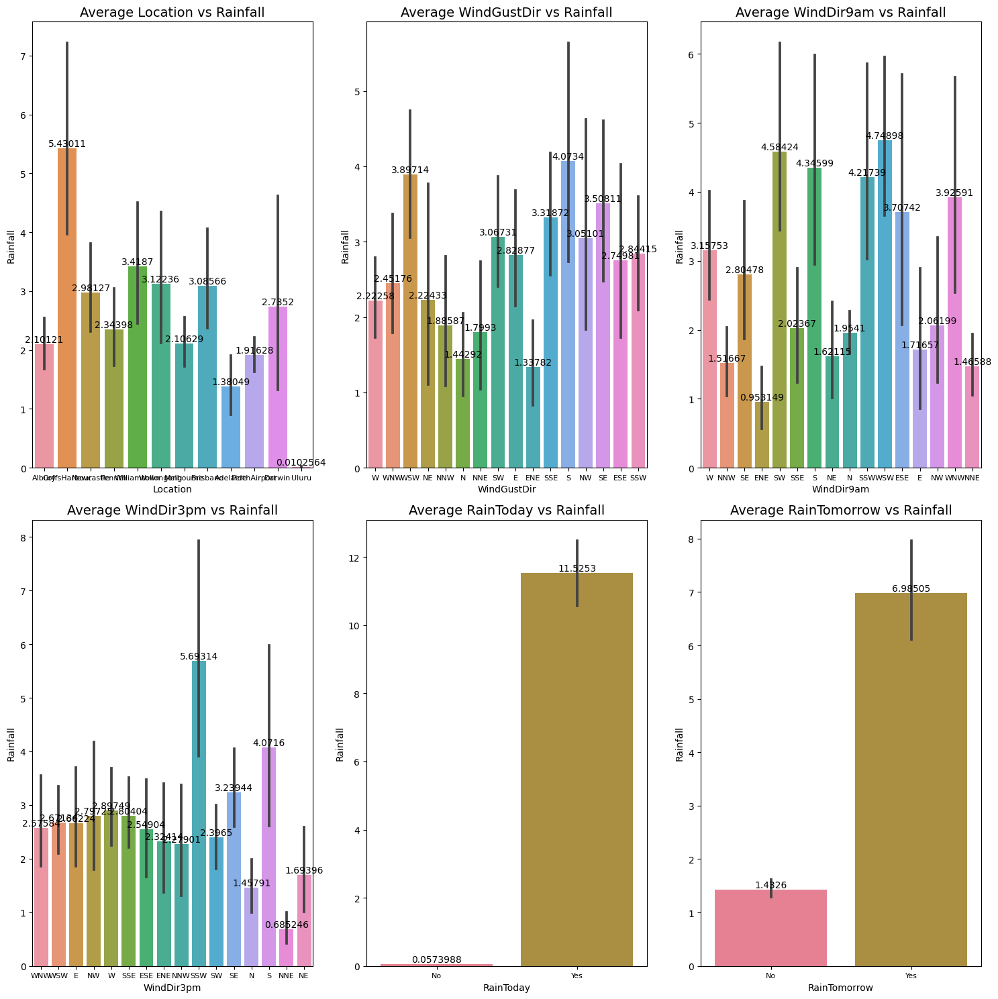

In [38]:
# Visualization of Categorical column Vs Rainfall
plt.figure(figsize=(15, 15))
p = 1

for i in categorical_columns:
    if p <= 6:
        plt.subplot(2, 3, p)
        ax = sns.barplot(x=i, y='Rainfall', data=df)
        for container in ax.containers:
            ax.bar_label(container)
        plt.title(f'Average {i} vs Rainfall', fontsize=14)
        plt.xticks(fontsize=8)
    p += 1

plt.tight_layout()
plt.show()

### `Observations:`

1. **Rainfall vs. Location:**
   - For a 'Rainfall' value of 0.0:
     - Various locations like 'Adelaide', 'Albury', 'Brisbane', 'CoffsHarbour', and 'Darwin' have a high count of 0.0 rainfall (ranging from 61.37% to 82.40%).
   - For other non-zero rainfall values, the count and percentage are considerably lower.

2. **Rainfall vs. WindGustDir:**
   - For a 'Rainfall' value of 0.0:
     - 'E', 'N', 'NE', 'NW', 'SE', and 'W' are the dominant wind gust directions for this condition.
   - For other non-zero rainfall values, the count and percentage are considerably lower.

3. **Rainfall vs. WindDir9am:**
   - For a 'Rainfall' value of 0.0:
     - 'E' and 'ESE' have the highest percentages, followed by 'ENE' and 'N'.
   - For other non-zero rainfall values, the count and percentage are considerably lower.

4. **Rainfall vs. WindDir3pm:**
   - For a 'Rainfall' value of 0.0:
     - 'E' and 'ENE' are dominant, followed by 'ESE' and 'NE'.
   - For other non-zero rainfall values, the count and percentage are considerably lower.

5. **Rainfall vs. RainToday:**
   - When 'RainToday' is 'No' and 'Rainfall' is 0.0, the percentage is quite high (86.17%).
   - When 'RainToday' is 'No' and 'Rainfall' has non-zero values, the count and percentage are considerably lower.

6. **Rainfall vs. RainTomorrow:**
   - For a 'Rainfall' value of 0.0:
     - When 'RainTomorrow' is 'No', the percentage is 74.32%.
     - When 'RainTomorrow' is 'Yes', the percentage is lower (39.12%).
   - For other non-zero rainfall values, the count and percentage are considerably lower.

It's evident that most of the records have no rainfall (0.0), and the percentages for non-zero rainfall values decrease significantly. The relationship between rainfall and other variables, such as wind direction, varies with the amount of rainfall.

### iii. comparing All numerical columns with our first target Rain Prediction

In [39]:
# Iterate through each numerical column
for col in numerical_columns:
    # Group by 'RainTommorrow' and the current numerical column
    RainTomorrow_counts = df.groupby(['RainTomorrow', col])[col].count()
    
    # Calculate the total count for each numeric in the current column
    total_counts = df.groupby(col)['RainTomorrow'].count()
    
    # Calculate the percentage of 'RainTomorrow' for each category in the current column
    RainTomorrow_percentages = (RainTomorrow_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    RainTomorrow_df = pd.concat([RainTomorrow_counts, RainTomorrow_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(RainTomorrow_df)
    print('\n')

                      Count  Percentage
RainTomorrow MinTemp                   
No           -2.0         2      100.00
             -1.7         1      100.00
             -1.5         1      100.00
             -1.4         1      100.00
             -1.3         2      100.00
...                     ...         ...
Yes           25.6        1       33.33
              25.8        2       66.67
              25.9        1      100.00
              26.2        1       33.33
              27.0        2      100.00

[525 rows x 2 columns]


                      Count  Percentage
RainTomorrow MaxTemp                   
No           8.2          1      100.00
             8.3          1      100.00
             9.4          1      100.00
             9.6          2      100.00
             9.8          1       33.33
...                     ...         ...
Yes          40.3         1       25.00
             41.4         1      100.00
             41.5         1       50.00
             4

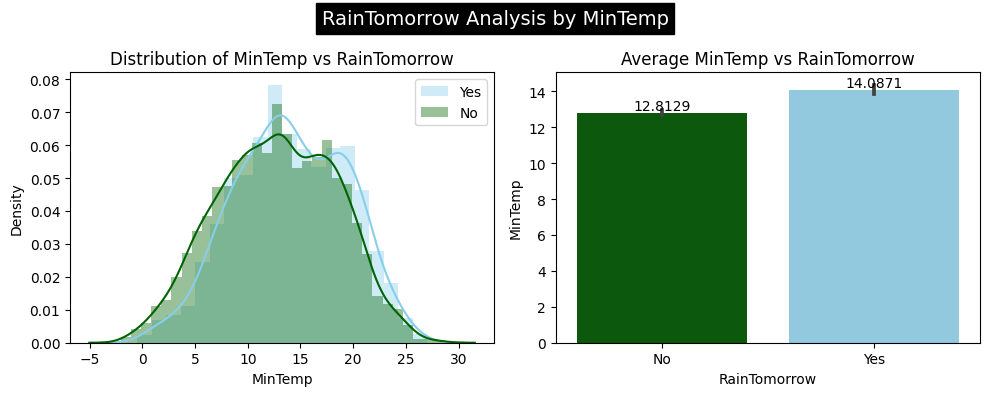

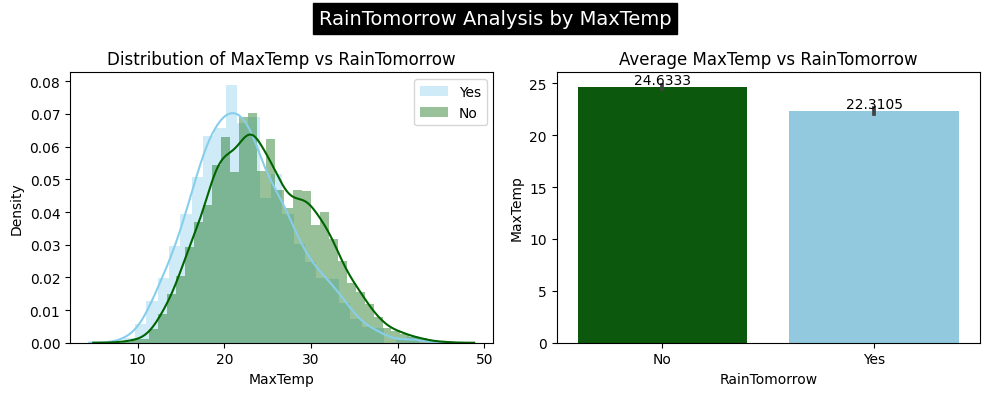

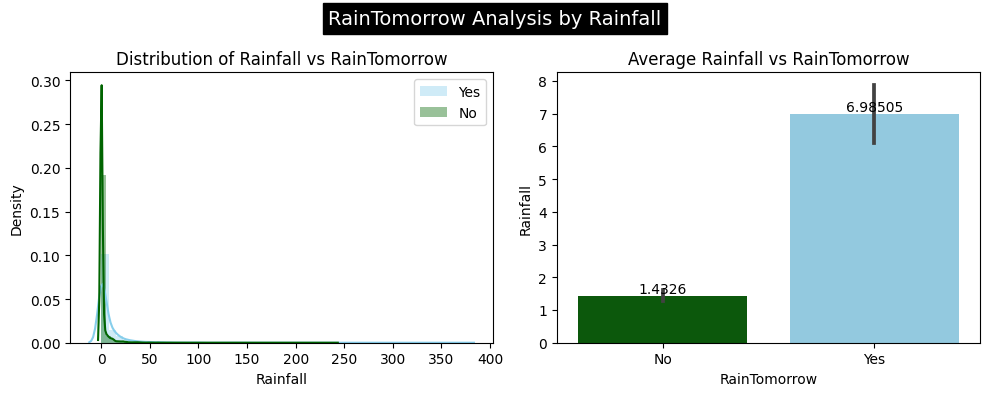

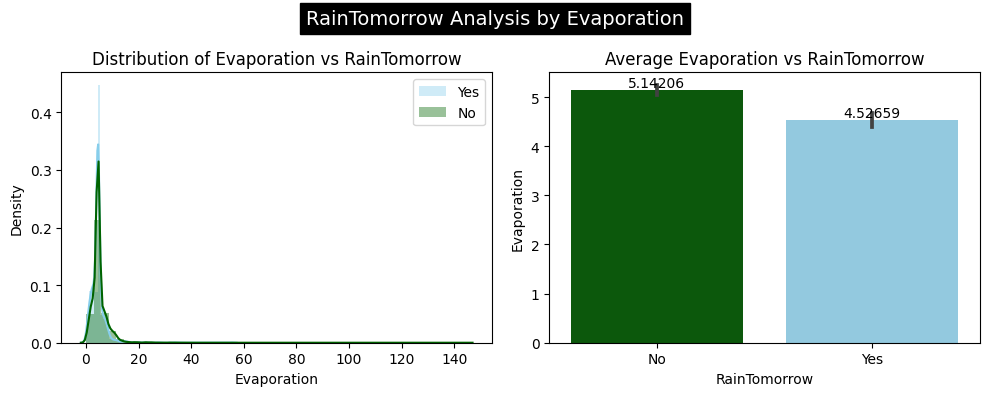

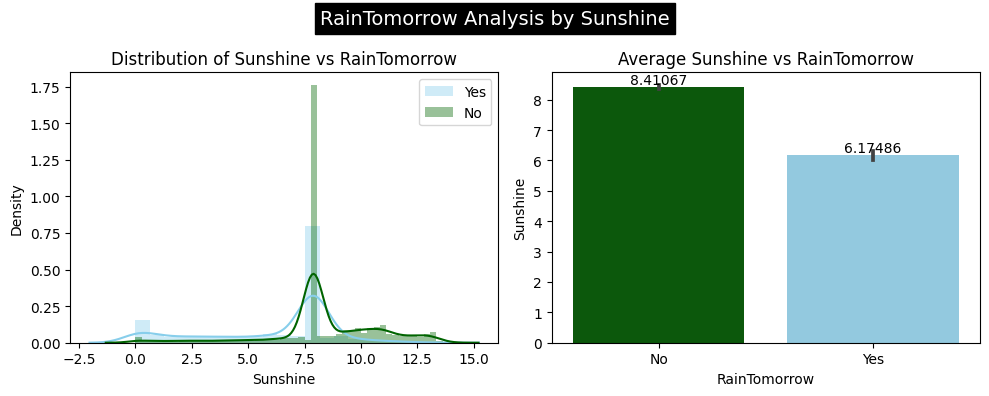

...

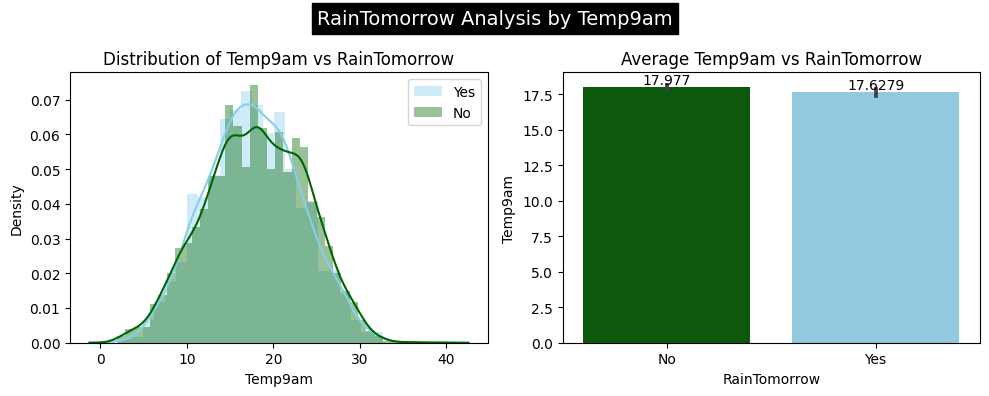

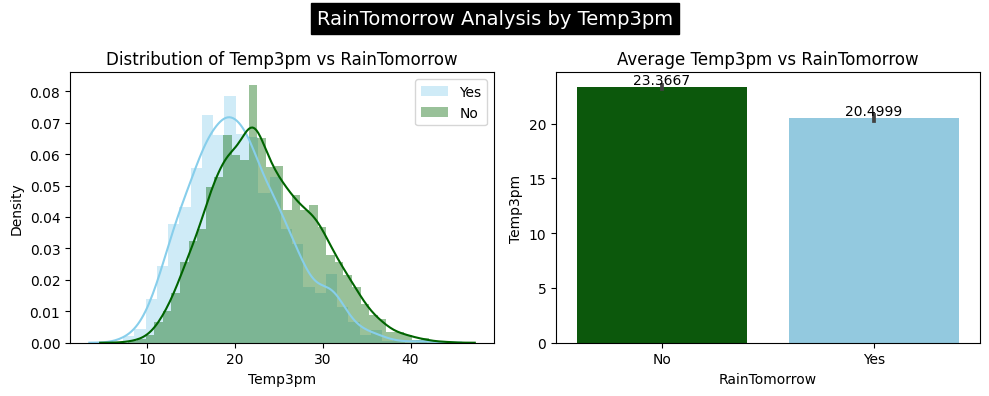

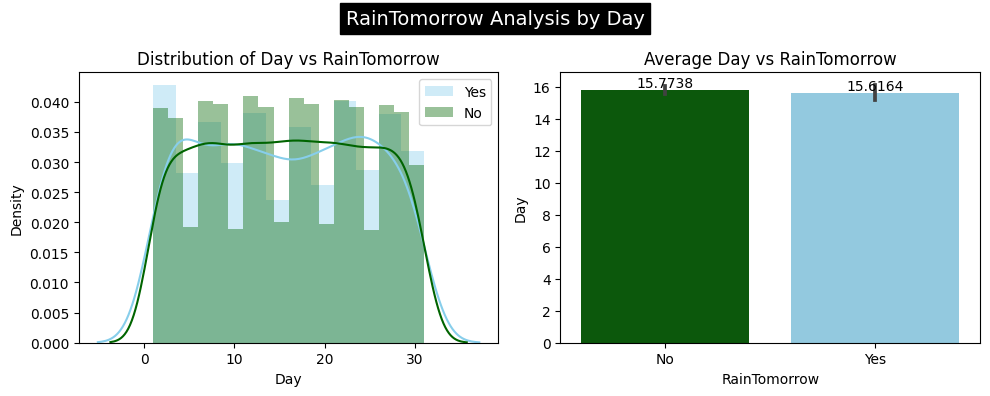

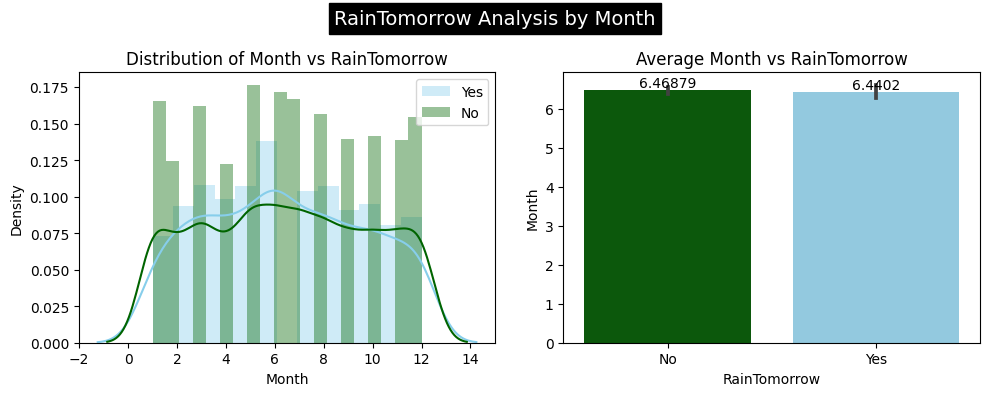

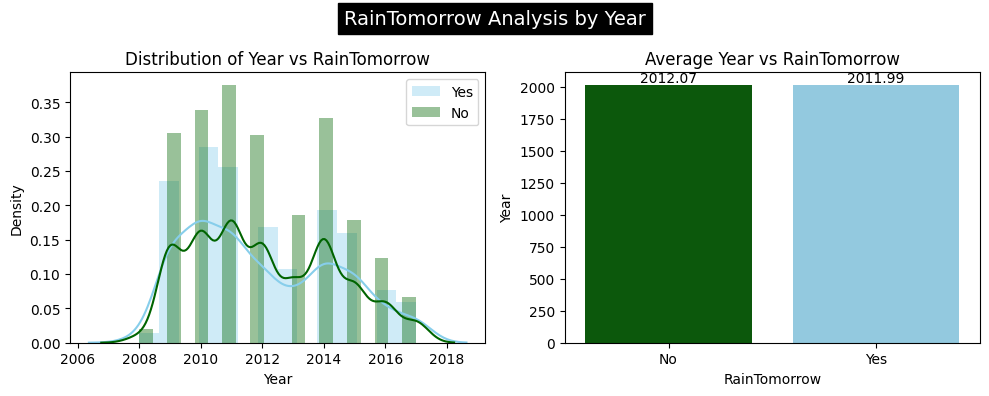

In [40]:
# Visualizing it:
for i in numerical_columns:
    
    #create Subplots
    fig, axes =plt.subplots(1,2,figsize=(10,4))
    
    # First Plot: Distribution of Numerical columns vs RainTomorrow
    sns.distplot(df[df['RainTomorrow']=="Yes"][i], label= "Yes", color='skyblue', ax=axes[0])
    sns.distplot(df[df['RainTomorrow']=="No"][i],label="No", color='Darkgreen', ax=axes[0])
    axes[0].set_title(f"Distribution of {i} vs RainTomorrow")
    axes[0].legend()
    
    # Second Plot: Avg. Numerical columns vs Income
    ax=sns.barplot(x='RainTomorrow', y=i, data=df, palette={"Yes": "skyblue", "No": "Darkgreen"}, ax=axes[1])
    for container in ax.containers:
        ax.bar_label(container)
    axes[1].set_title(f'Average {i} vs RainTomorrow')
    
    fig.suptitle(f"RainTomorrow Analysis by {i}", fontsize=14, backgroundcolor='black',color='white')
    
    # Adjust layout to prevent overlapping
    plt.tight_layout()
    # Show the plots
    plt.show()

### `Observations:`

These observations provide insights into the distribution of various weather-related features based on the 'RainTomorrow' class. Here are some key points:

1. **MinTemp and MaxTemp:**
   - The table shows the distribution of minimum and maximum temperatures for both rainy and non-rainy days.
   - For example, there are instances where the minimum temperature is -2.0, and it didn't rain on those days (100%).
   - Similar distributions are observed for various temperature ranges.

2. **Rainfall:**
   - The table provides information on the amount of rainfall on rainy and non-rainy days.
   - For non-rainy days, a significant percentage (86.25%) had no rainfall (Rainfall = 0.0).
   - Rainy days show a diverse range of rainfall amounts.

3. **Evaporation and Sunshine:**
   - Similar to Rainfall, the distribution of Evaporation and Sunshine varies for rainy and non-rainy days.
   - For example, non-rainy days commonly have Sunshine values of 0.0, while rainy days show more variability.

4. **Wind Speed and Gust Speed:**
   - Wind-related features such as WindGustSpeed, WindSpeed9am, and WindSpeed3pm exhibit diverse distributions for rainy and non-rainy days.
   - WindGustSpeed of 7.0 is common on non-rainy days (100%), while WindGustSpeed varies more on rainy days.

5. **Humidity:**
   - Humidity at 9 am and 3 pm shows diverse distributions for both rainy and non-rainy days.
   - For instance, a Humidity9am of 10.0 is recorded on non-rainy days (100%), while Humidity3pm exhibits more variability.

6. **Pressure:**
   - The atmospheric pressure at 9 am and 3 pm varies for rainy and non-rainy days.

7. **Cloud Cover:**
   - Cloud cover at 9 am and 3 pm (Cloud9am, Cloud3pm) shows different distributions for rainy and non-rainy days.

8. **Temperature at 9 am and 3 pm:**
   - The distribution of temperatures at 9 am and 3 pm varies for rainy and non-rainy days.

9. **Day, Month, and Year:**
   - The distribution of days, months, and years provides insights into the temporal aspect of rainfall occurrence.

### iv. comparing All numerical columns with our first target Rainfall

In [41]:
# Iterate through each numerical column
for col in numerical_columns:
    
    # Group by 'Rainfall' and the current categorical column
    Rainfall_counts = df.groupby(['Rainfall', col])[col].count()
    
    # Calculate the total count for each category in the current column
    total_counts = df.groupby(col)['Rainfall'].count()
    
    # Calculate the percentage of 'Rainfall' for each category in the current column
    Rainfall_percentages = (Rainfall_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    Rainfall_df = pd.concat([Rainfall_counts, Rainfall_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(Rainfall_df)
    print('*'*60)

                     Count  Percentage
Rainfall MinTemp                      
0.0      -2.000000       2      100.00
         -1.700000       1      100.00
         -1.500000       1      100.00
         -1.400000       1      100.00
         -1.300000       2      100.00
...                    ...         ...
142.2     24.100000      1       16.67
168.4     21.300000      1        4.76
225.0     18.500000      1        2.27
240.0     13.109145      1        1.43
371.0     17.400000      1        4.35

[2253 rows x 2 columns]
************************************************************
                  Count  Percentage
Rainfall MaxTemp                   
0.0      8.2          1      100.00
         8.3          1      100.00
         8.4          1      100.00
         8.8          1       50.00
         9.4          1      100.00
...                 ...         ...
142.2    29.8         1        2.63
168.4    26.6         1        3.70
225.0    19.9         1        2.78
240.0    21

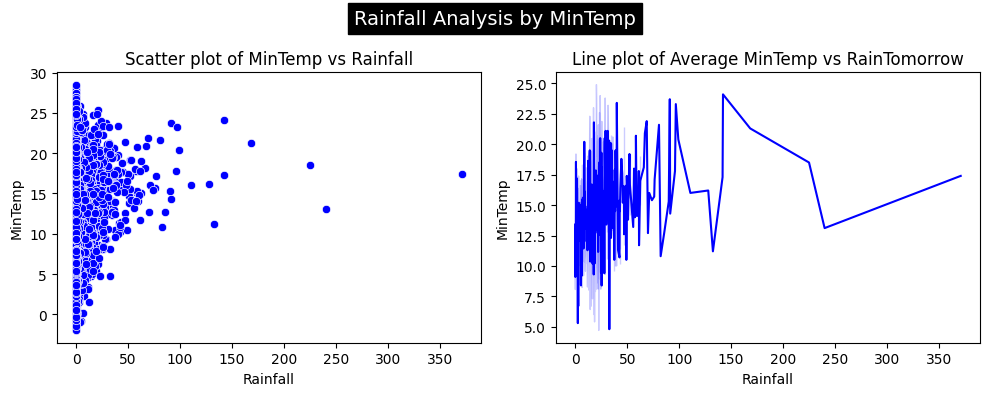

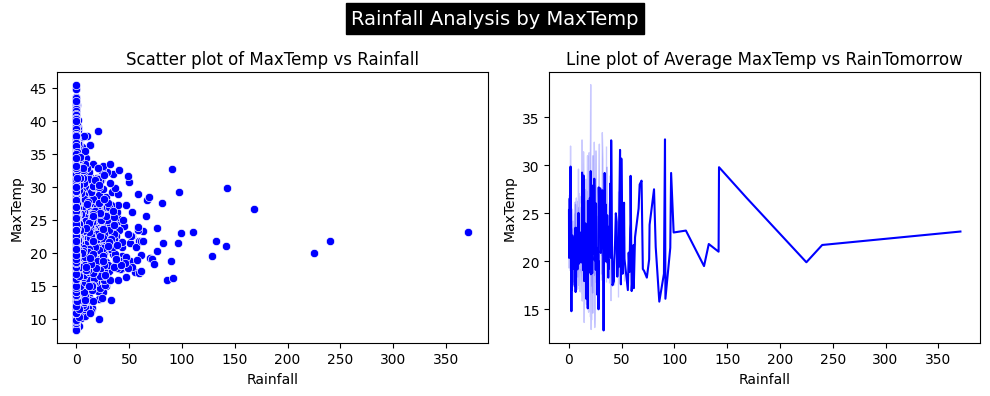

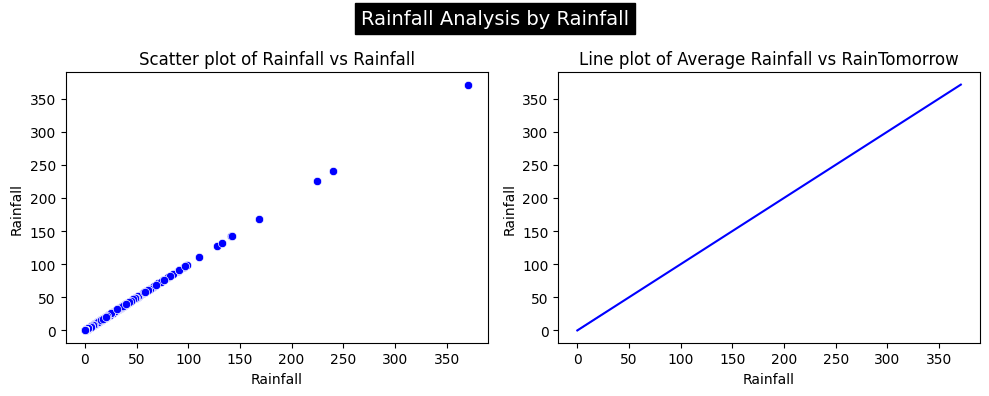

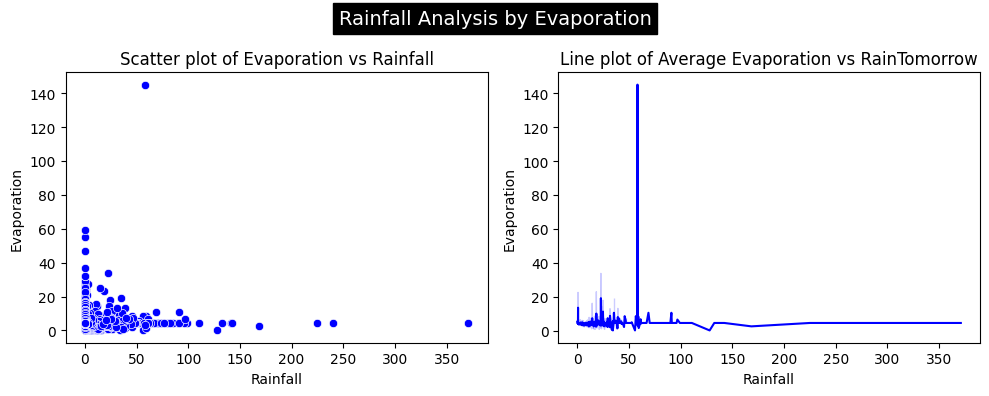

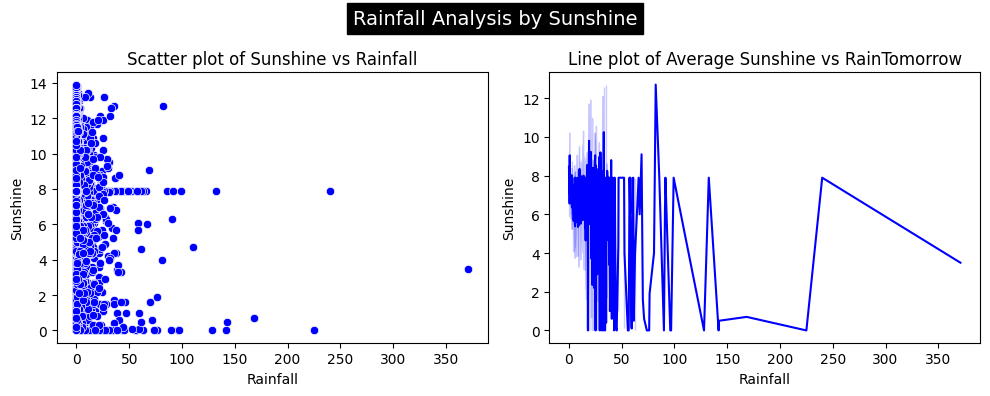

...

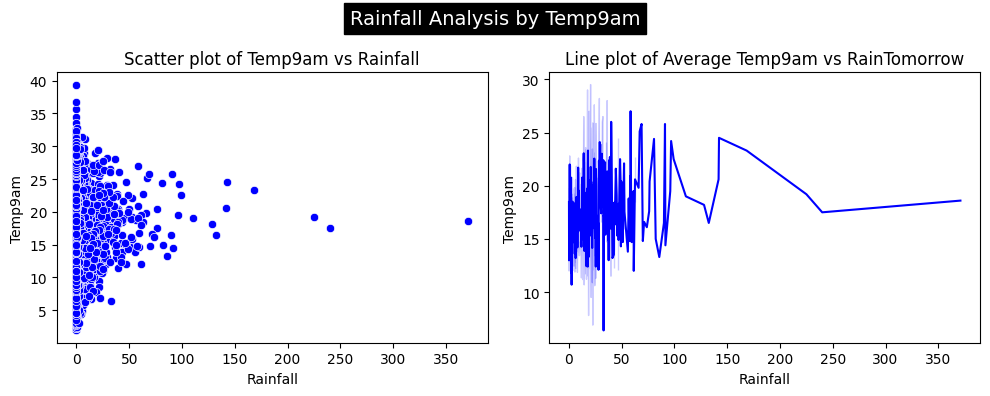

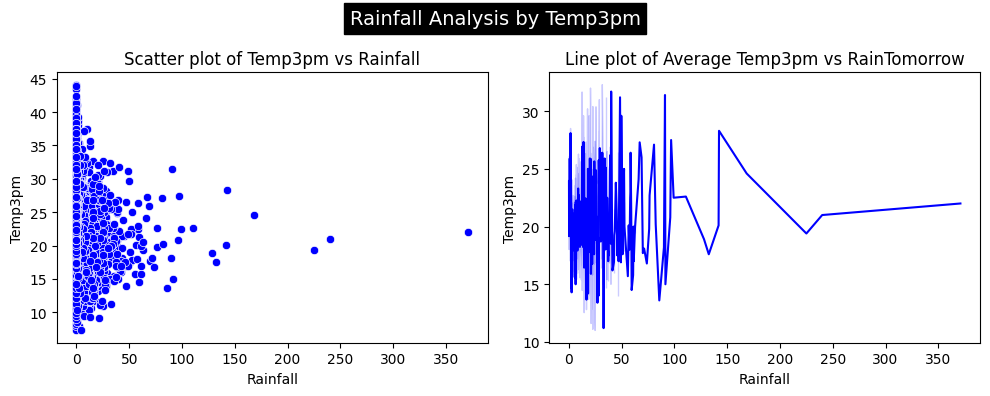

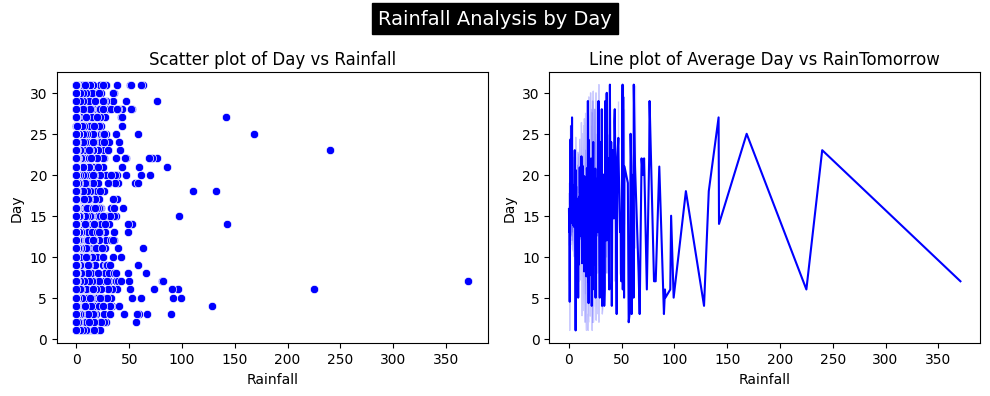

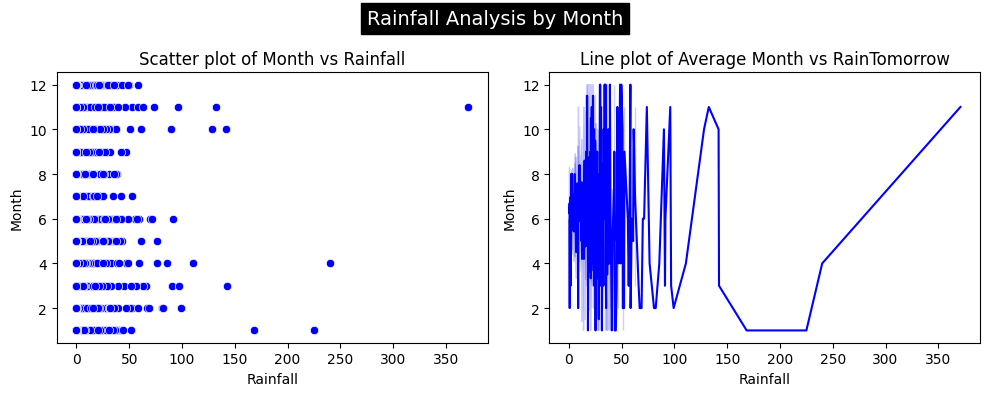

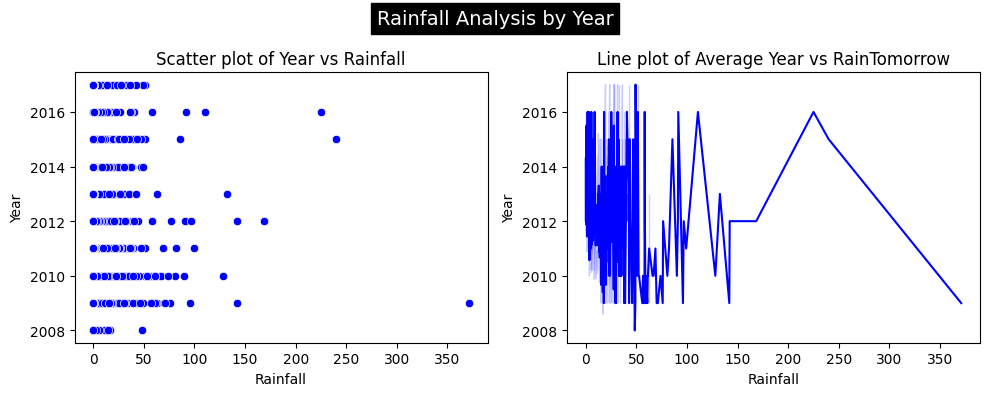

In [42]:
# Visualizing it:
for i in numerical_columns:
    
    # Create Subplots
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    
    # First Plot: Scatter plot of Numerical columns vs Rainfall
    sns.scatterplot(x='Rainfall', y=i, data=df, color='blue', ax=axes[0])
    axes[0].set_title(f"Scatter plot of {i} vs Rainfall")
    
    # Second Plot: Line plot of Avg. Numerical columns vs Rainfall
    ax = sns.lineplot(x='Rainfall', y=i, data=df, color='blue', ax=axes[1])
    axes[1].set_title(f'Line plot of Average {i} vs RainTomorrow')
    
    fig.suptitle(f"Rainfall Analysis by {i}", fontsize=14, backgroundcolor='black', color='white')
    
    # Adjust layout to prevent overlapping
    plt.tight_layout()
    # Show the plots
    plt.show()

### `Observations:`

1. **MinTemp and MaxTemp:**
   - The data shows various minimum and maximum temperatures for different rainfall amounts.
   - For instance, for a rainfall of 0.0, the MinTemp ranges from -2.0 to 2.0, each with 100% frequency.
   - Similar observations can be made for MaxTemp.

2. **Rainfall and Evaporation:**
   - There are different rainfall amounts associated with various evaporation levels.
   - For example, for a rainfall of 0.0, there are instances of evaporation ranging from 0.0 to 0.8, each with varying percentages.

3. **Rainfall and Sunshine:**
   - The relationship between rainfall and sunshine hours is captured.
   - For instance, for a rainfall of 0.0, there are instances of sunshine ranging from 0.0 to 0.4, each with varying percentages.

4. **Rainfall and WindGustSpeed:**
   - The data depicts the WindGustSpeed distribution for different rainfall amounts.
   - For example, for a rainfall of 0.0, WindGustSpeed varies from 7.0 to 15.0, with percentages for each value.

5. **Rainfall and Humidity:**
   - Humidity at 9 am and 3 pm is presented for different rainfall amounts.
   - For example, for a rainfall of 0.0, Humidity9am ranges from 10.0 to 15.0, each with 100% frequency.

6. **Rainfall and Pressure:**
   - The relationship between rainfall and atmospheric pressure at 9 am and 3 pm is displayed.
   - For instance, for a rainfall of 0.0, Pressure9am ranges from 996.1 to 999.9, each with varying percentages.

7. **Rainfall and Cloud Cover:**
   - Cloud cover at 9 am and 3 pm is illustrated for different rainfall amounts.
   - For example, for a rainfall of 0.0, Cloud9am ranges from 0.0 to 4.0, each with varying percentages.

8. **Rainfall and Temperature:**
   - The distribution of temperatures at 9 am and 3 pm is presented for different rainfall amounts.
   - For example, for a rainfall of 0.0, Temp9am ranges from 1.9 to 2.4, each with varying percentages.

9. **Rainfall and Day/Month/Year:**
   - The distribution of rainfall occurrences across days, months, and years is illustrated.
   - For instance, for a rainfall of 0.0, there are varying occurrences across different days, months, and years.

### v. comparing our both target Rainfall and Raintommorrow

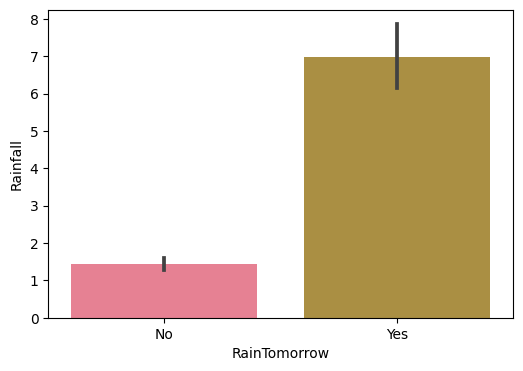

In [43]:
# RainTomorrow Vs Rainfall
plt.figure(figsize=(6,4))
sns.barplot(x=df['RainTomorrow'], y=df['Rainfall'])
plt.show()

## c. Multivariate Analysis

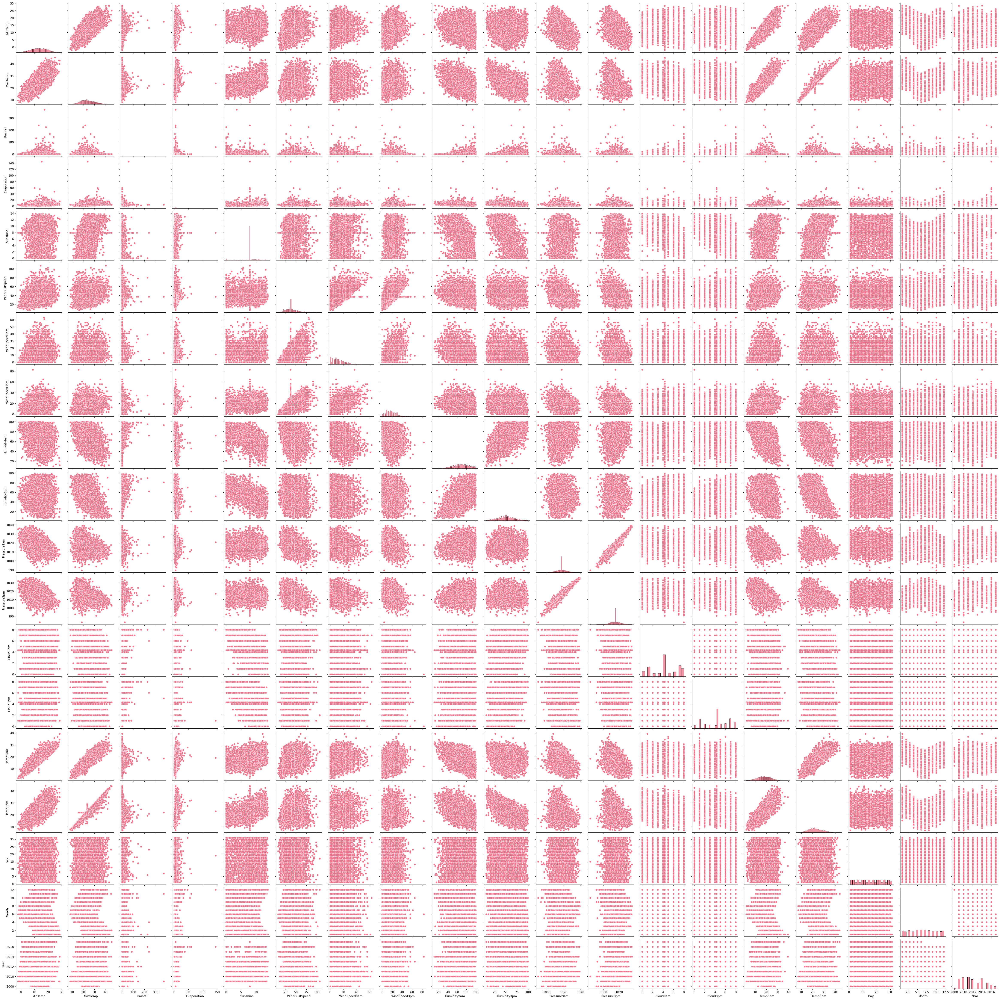

In [44]:
sns.pairplot(df)
plt.show()

### `Observations:`
The plot indicates the presence of outliers in several columns. Additionally, histograms are visible along the diagonal axis.

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 7. Outlier Detection & Treatment</h2>
</div>

## a. Outlier Detection:

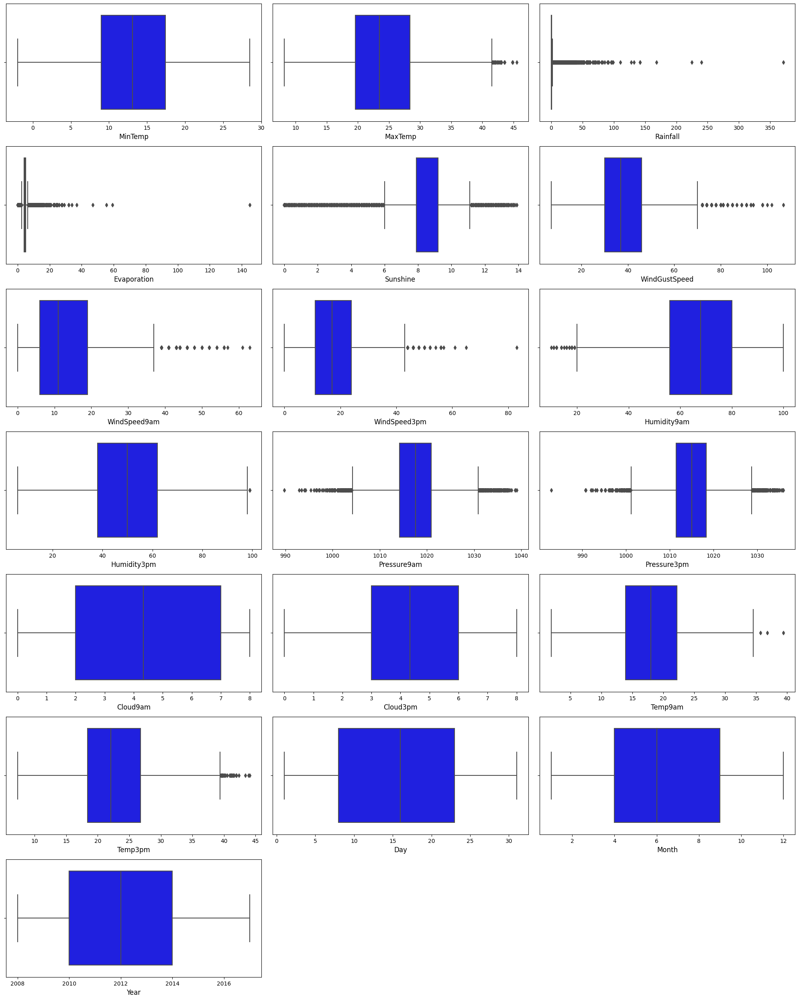

In [45]:
# Identifying the outliers present in numerical columns using boxplot
plt.figure(figsize=(20,25))
plotnumber=1
for col in numerical_columns:
    if plotnumber<=20:
        ax=plt.subplot(7,3,plotnumber)
        sns.boxplot(x=col, data=df,color='blue')
        plt.xlabel(col,fontsize=12)
    plotnumber+=1
plt.tight_layout()

## b. Outlier Treatment

### i. Zscore Treatment

In [46]:
# Creating a list with Columns which has outliers
outlier_columns=['MaxTemp', 'Rainfall', 'Evaporation',
                 'Sunshine','WindGustSpeed', 'WindSpeed9am',
                 'WindSpeed3pm', 'Humidity9am','Humidity3pm',
                 'Pressure9am', 'Pressure3pm','Temp9am', 'Temp3pm',]


# Calculate the z-scores for the specified numerical columns
z = np.abs(zscore(df[outlier_columns]))

# Create a new DataFrame df1 with rows where z-scores are less than 3 for all numerical columns
df1 = df[(z < 3).all(axis=1)]
df1.shape

(6405, 25)

### ii. IQR Technique

In [47]:
df2 = df.copy()

for column in outlier_columns:
    IQR = df2[column].quantile(0.75)-df2[column].quantile(0.25)
    lower_bridge = df2[column].quantile(0.25) - (IQR * 1.5)
    upper_bridge = df2[column].quantile(0.75) + (IQR * 1.5)
    
    # Remove outliers
    df2 = df2[~((df2[column] < lower_bridge) | (df2[column] > upper_bridge))]

# Print the shape of the DataFrame after outlier removal
print("Shape after outlier removal:", df2.shape)

Shape after outlier removal: (2351, 25)


## c. Data loss Calculation

In [48]:
# checking the data loss for zscore
data_loss_zscore = (6762-6405)/6405*100
print('Dataloss using zscore:',data_loss_zscore)

# checking the data loss for IQR
data_loss_IQR = (6405-2351)/6405*100
print('Dataloss using IQR:',data_loss_IQR)

Dataloss using zscore: 5.573770491803279
Dataloss using IQR: 63.294301327088206


## d. Final technique

In [49]:
# Choosing zscore for outlier treatment
df=df1

# Checking the shape of our dataframe after removing outliers using Zscore
df.shape

(6405, 25)

### `Observations:`

Outliers were detected in the following columns: 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm'.

We employed two outlier removal techniques, Zscore and IQR. After applying these methods, we calculated data loss percentages: 5.57% for Zscore and 63.29% for IQR, indicating a significant loss of data with the IQR method. Consequently, we have decided to finalize the use of Zscore as the preferred technique for removing outliers.

The current shape of our dataframe is 6405 rows and 25 columns.

In [50]:
#Saving Clean Data
file_path = "clean_data_Rainfall.csv"
df.to_csv(file_path, index=False)

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 8. skewness detection & Treatment </h2>
</div>

In [51]:
df.skew()

MinTemp         -0.078085
MaxTemp          0.267864
Rainfall         3.520665
Evaporation      1.118992
Sunshine        -0.889339
WindGustSpeed    0.545596
WindSpeed9am     0.682369
WindSpeed3pm     0.344082
Humidity9am     -0.234330
Humidity3pm      0.156516
Pressure9am      0.066558
Pressure3pm      0.092315
Cloud9am        -0.203078
Cloud3pm        -0.146885
Temp9am         -0.071905
Temp3pm          0.293455
Day              0.005249
Month            0.032796
Year             0.352952
dtype: float64

### Treating Skewness

In [52]:
# Columns to be transformed
skew_columns = ['Rainfall', 'Evaporation', 'WindSpeed9am']

# Initialize the PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

df[skew_columns] = scaler.fit_transform(df[skew_columns].values)

# Checking Skewness after treating skewness
df.skew()

MinTemp         -0.078085
MaxTemp          0.267864
Rainfall         1.065122
Evaporation      0.060615
Sunshine        -0.889339
WindGustSpeed    0.545596
WindSpeed9am    -0.130923
WindSpeed3pm     0.344082
Humidity9am     -0.234330
Humidity3pm      0.156516
Pressure9am      0.066558
Pressure3pm      0.092315
Cloud9am        -0.203078
Cloud3pm        -0.146885
Temp9am         -0.071905
Temp3pm          0.293455
Day              0.005249
Month            0.032796
Year             0.352952
dtype: float64

### `Observations:`

Skewness has been successfully reduced for several columns after applying the power transformation method (yeo-johnson). Skewed features tend to have long tails, and reducing skewness helps in achieving a more normal distribution, which is often beneficial for machine learning models.

The columns with reduced skewness include 'Rainfall', 'Evaporation', 'WindSpeed9am', and others.

Some columns had negative skewness initially and continue to have negative skewness after transformation (e.g., 'Cloud9am', 'Cloud3pm', 'Temp9am'), indicating that these columns originally had a left-skewed distribution, and the transformation has further enhanced this property.

Positive skewness in columns like 'Rainfall', 'Evaporation', 'WindSpeed9am' has been reduced, suggesting a more symmetric distribution.

Skewness reduction is an important preprocessing step, especially for machine learning algorithms that assume normality or perform better with symmetrically distributed data.

The transformation is applied to numerical features, and categorical features are usually handled separately through encoding techniques.

The overall distributional shape of the features has been modified to make the data more suitable for modeling.

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 9. Encoding Categorical Columns</h2>
</div>

In [53]:
# Initating Label Encoder
le = LabelEncoder()

#Iterate over Categorical columns
for i in categorical_columns:
    df[i] = le.fit_transform(df[i])

df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.802149,0.019152,7.890896,13,44.0,13,14,...,1007.1,8.000000,4.320988,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,-0.646716,0.019152,7.890896,14,44.0,6,15,...,1007.8,4.336806,4.320988,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,-0.646716,0.019152,7.890896,15,46.0,13,15,...,1008.7,4.336806,2.000000,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,-0.646716,0.019152,7.890896,4,24.0,9,0,...,1012.8,4.336806,4.320988,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,1.165262,0.019152,7.890896,13,41.0,1,7,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008


### `observations:`

We have converted all categorical columns into numerical representations using Label Encoder.

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 10. Correlation</h2>
</div>

## a. Correlation of all the Features

In [54]:
df_cor = df.corr()
df_cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
Location,1.000000,0.091711,0.073163,0.003313,0.109779,0.058077,-0.086740,0.269819,-0.102867,-0.000110,...,-0.018292,-0.005569,-0.004753,0.098836,0.069084,-0.004064,0.001047,-0.004824,-0.070775,0.504642
MinTemp,0.091711,1.000000,0.730443,0.071254,0.385046,0.046470,-0.142466,0.244192,-0.021335,-0.143475,...,-0.447498,0.094939,0.044612,0.892863,0.699937,0.072284,0.092327,0.018313,-0.235969,0.034034
MaxTemp,0.073163,0.730443,1.000000,-0.249556,0.488757,0.358502,-0.202044,0.171035,-0.192569,-0.165304,...,-0.425968,-0.240513,-0.239326,0.865546,0.975189,-0.219597,-0.158306,0.019890,-0.172224,0.083746
Rainfall,0.003313,0.071254,-0.249556,1.000000,-0.213268,-0.271955,0.112559,0.070265,0.152918,0.113943,...,-0.029997,0.318495,0.277897,-0.107258,-0.260766,0.931729,0.329587,-0.009313,-0.006195,0.007281
Evaporation,0.109779,0.385046,0.488757,-0.213268,1.000000,0.416652,-0.121925,0.213578,-0.113451,-0.028743,...,-0.306972,-0.132476,-0.176777,0.455848,0.475805,-0.184877,-0.111478,0.007102,-0.041669,0.092125
Sunshine,0.058077,0.046470,0.358502,-0.271955,0.416652,1.000000,-0.094801,0.039405,-0.078618,-0.053638,...,-0.084836,-0.534641,-0.557336,0.243782,0.376608,-0.237414,-0.333100,-0.001910,0.003092,0.053708
WindGustDir,-0.086740,-0.142466,-0.202044,0.112559,-0.121925,-0.094801,1.000000,0.023365,0.381934,0.456003,...,-0.006673,0.113068,0.073411,-0.158453,-0.212044,0.108370,0.033716,0.016802,0.032303,-0.184168
WindGustSpeed,0.269819,0.244192,0.171035,0.070265,0.213578,0.039405,0.023365,1.000000,-0.062442,0.089590,...,-0.326115,0.002130,0.036652,0.224791,0.139337,0.078237,0.163852,-0.002839,0.047766,-0.032164
WindDir9am,-0.102867,-0.021335,-0.192569,0.152918,-0.113451,-0.078618,0.381934,-0.062442,1.000000,0.207862,...,0.058139,0.070301,0.053819,-0.067128,-0.200892,0.149877,0.034460,-0.007582,0.020991,-0.082950
WindDir3pm,-0.000110,-0.143475,-0.165304,0.113943,-0.028743,-0.053638,0.456003,0.089590,0.207862,1.000000,...,-0.041407,0.069949,0.048944,-0.150248,-0.176879,0.095332,-0.000168,0.001450,0.029916,0.005258


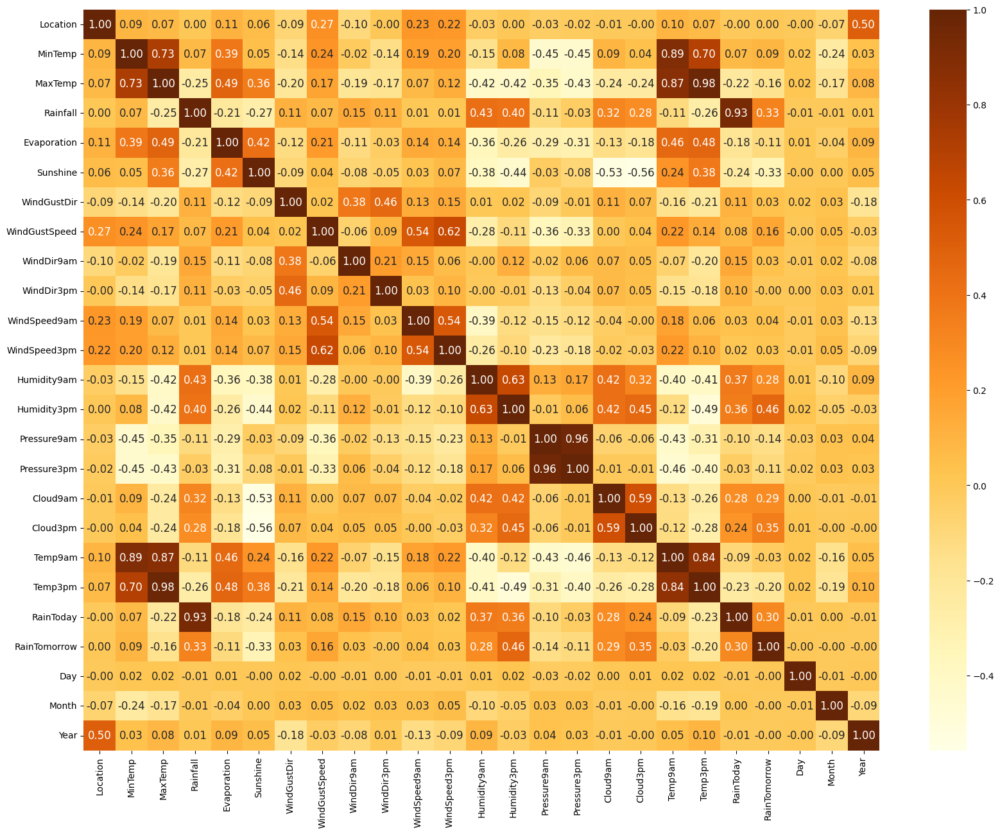

In [55]:
# Visualizing it
plt.figure(figsize=(20, 15))
sns.heatmap(df_cor, annot=True, fmt='.2F', cmap='YlOrBr', annot_kws={"size": 12})
plt.show()

### `Observations:`

1. **Strong Positive Correlations:**
   - 'MaxTemp' and 'Temp3pm' have a high positive correlation of 0.975189.
   - 'Temp9am' and 'Temp3pm' also show a strong positive correlation of 0.835134.
   - 'Pressure9am' and 'Pressure3pm' have a strong positive correlation of 0.961787.
   - 'MinTemp' and 'Temp9am' exhibit a strong positive correlation of 0.892863.

2. **Strong Negative Correlations:**
   - 'Humidity9am' and 'Sunshine' show a significant negative correlation of -0.380269.
   - 'Humidity3pm' and 'Sunshine' also have a notable negative correlation of -0.436820.

3. **Other Interesting Correlations:**
   - 'Rainfall' and 'RainToday' have a positive correlation of 0.701892, indicating that if it rains today, there's a high chance of measurable rainfall.
   - 'Year' and 'Location' show a positive correlation of 0.504642, suggesting some temporal or spatial association.

4. **Day and Month:**
   - 'Day' and 'Month' do not seem to have strong correlations with other variables, with most correlation coefficients close to zero.

### i. Highly correlated with each other

In [56]:
correlation_threshold = 0.85
mask = df_cor.abs() >= correlation_threshold
features_to_drop = set()
for i in range(len(df_cor.columns)):
    for j in range(i+1, len(df_cor.columns)):
        if mask.iloc[i, j]:
            colname_i = df_cor.columns[i]
            colname_j = df_cor.columns[j]
            if colname_i not in features_to_drop:
                features_to_drop.add(colname_j)

In [57]:
# Calling the function:
features_to_drop

{'Pressure3pm', 'RainToday', 'Temp3pm', 'Temp9am'}

In [58]:
# dropping irrelevant columns
df.drop(columns=['Pressure3pm', 'Temp3pm', 'Temp9am', 'RainToday'],axis=1,inplace=True)

In [59]:
df.shape # checking the shape after dropping correlated columns

(6405, 21)

### `Observations:`

It is evident that 4 of the columns in the dataframe exhibit a high correlation of 85% or more with each other, so we have dropped those columns. Now, we have 21 columns and 6405 rows in our dataframe.

### ii. Copying dataframe as we have two problem statement

In [60]:
# Copying dataframe
df1 = df.copy()

### `Obervations:`
We have duplicated our dataset, with the original being referred to as 'df' for RainfallTommorrow analysis, and the duplicate named 'df1' for amount of rainfall analysis. This separation allows us to work on two distinct target variables: Rainfall Prediction and Rainfall Amount

## b. Correlation with our first Target Rainfall Prediction

In [61]:
#correlation with target column(RainTomorrow)
correlation_with_RainTomorrow = df.corr()['RainTomorrow'].abs().sort_values(ascending=False)
print(correlation_with_RainTomorrow)

RainTomorrow     1.000000
Humidity3pm      0.463724
Cloud3pm         0.350736
Sunshine         0.333100
Rainfall         0.329587
Cloud9am         0.286797
Humidity9am      0.283625
WindGustSpeed    0.163852
MaxTemp          0.158306
Pressure9am      0.139487
Evaporation      0.111478
MinTemp          0.092327
WindSpeed9am     0.041446
WindDir9am       0.034460
WindGustDir      0.033716
WindSpeed3pm     0.026138
Month            0.003892
Year             0.003841
Day              0.002229
Location         0.001047
WindDir3pm       0.000168
Name: RainTomorrow, dtype: float64


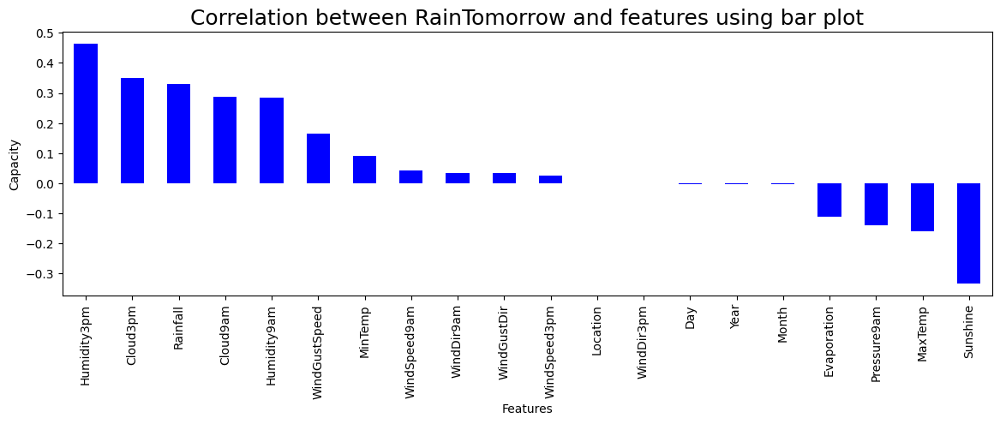

In [62]:
plt.figure(figsize=(14,4))
df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='blue')
plt.xlabel('Features',fontsize=10)
plt.ylabel('Capacity',fontsize=10)
plt.title('Correlation between RainTomorrow and features using bar plot',fontsize=18)
plt.show()

In [63]:
# dropping irrelevant columns
df.drop(columns=['WindDir3pm','Location','Day','Year', 'Month'],axis=1,inplace=True)

In [64]:
df.shape

(6405, 16)

### `Observations:`

1. **Dropped Columns Based on Weak Correlation:**
   - 'WindDir3pm,' 'Location,' 'Day,' 'Year,' and 'Month' were dropped due to their weak correlations with 'RainTomorrow' (ranging from 0.000168 to 0.003892).
   - This decision aligns with the observation that these columns had weak positive correlations and were considered less influential in predicting 'RainTomorrow.'

2. **Remaining Highly Correlated Columns:**
   - 'Humidity3pm' (0.463724) and 'Cloud3pm' (0.350736) are highly correlated. Depending on the nature of your analysis, you may want to assess whether keeping both variables adds value or if one can be dropped.
   - 'RainToday' (0.303021) and 'Cloud9am' (0.286797) also exhibit a relatively high correlation. Evaluate their importance in your analysis to decide whether to retain both or drop one.

3. **Moderate and Weak Correlations:**
   - Columns with moderate positive correlations include 'Humidity9am,' 'Rainfall,' 'WindGustSpeed,' 'MaxTemp,' and 'Pressure9am.'
   - Columns with weak correlations include 'Evaporation,' 'MinTemp,' 'WindSpeed9am,' 'WindDir9am,' 'WindGustDir,' 'WindSpeed3pm,' 'RainTomorrow,' and the already dropped columns.

4. **Consideration for Further Analysis:**
   - Carefully assess the impact of dropping each column on the goals of your analysis, potential model performance, and the insights you aim to derive.
   - It's important to strike a balance between removing redundant or less influential features and retaining those crucial for predicting 'RainTomorrow.'

In summary, the decision to drop specific columns aligns with the observed weak correlations, and it's essential to consider the specific objectives of your analysis and the potential implications of dropping or retaining certain features.

## c. Correlation with our second Target Rainfall Amount

In [65]:
#correlation with target column(Rainfall)
correlation_with_Rainfall = df1.corr()['Rainfall'].abs().sort_values(ascending=False)
print(correlation_with_Rainfall)

Rainfall         1.000000
Humidity9am      0.425329
Humidity3pm      0.404194
RainTomorrow     0.329587
Cloud9am         0.318495
Cloud3pm         0.277897
Sunshine         0.271955
MaxTemp          0.249556
Evaporation      0.213268
WindDir9am       0.152918
WindDir3pm       0.113943
WindGustDir      0.112559
Pressure9am      0.107907
MinTemp          0.071254
WindGustSpeed    0.070265
Day              0.009313
WindSpeed3pm     0.007377
WindSpeed9am     0.007322
Year             0.007281
Month            0.006195
Location         0.003313
Name: Rainfall, dtype: float64


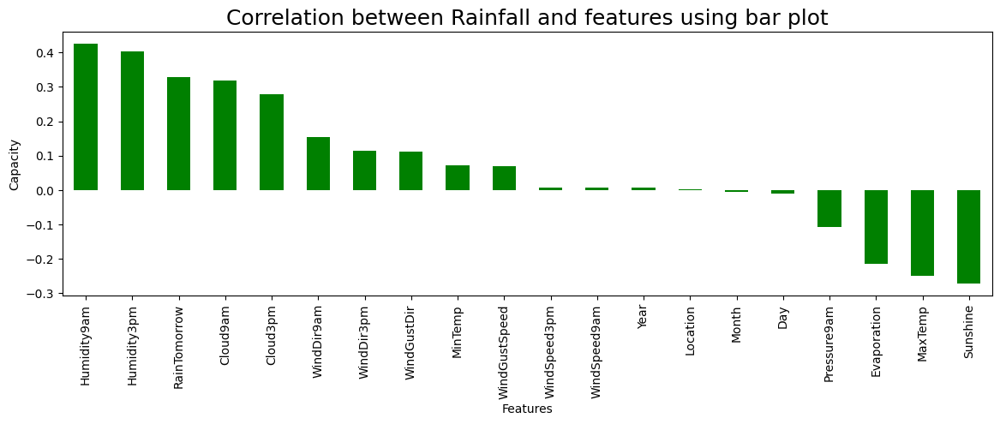

In [66]:
plt.figure(figsize=(14,4))
df1.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='green')
plt.xlabel('Features',fontsize=10)
plt.ylabel('Capacity',fontsize=10)
plt.title('Correlation between Rainfall and features using bar plot',fontsize=18)
plt.show()

In [67]:
# dropping irrelevant columns
df1.drop(columns=['Day', 'WindSpeed3pm', 'WindSpeed9am','Year', 'Month', 'Location'],axis=1,inplace=True)

In [68]:
df1.shape

(6405, 15)

### `Observations:`

1. **Highly Correlated Variables with 'Rainfall':**
   - 'RainToday' shows a strong positive correlation of 0.701892 with 'Rainfall,' indicating that measurable rainfall today is associated with higher overall rainfall.
   - 'Humidity9am' (0.302800) and 'Humidity3pm' (0.299083) also exhibit moderate positive correlations, suggesting a connection between humidity levels and rainfall.
   - 'RainTomorrow' has a moderate positive correlation of 0.274224 with 'Rainfall,' indicating some association between today's rainfall and the likelihood of rainfall tomorrow.

2. **Correlations with Cloud Cover:**
   - 'Cloud9am' (0.237332) and 'Cloud3pm' (0.195856) have positive correlations with 'Rainfall.' Higher cloud cover at both morning and afternoon times is associated with increased rainfall.
   - 'Sunshine' (0.184253) shows a positive correlation, suggesting an inverse relationship between sunshine and rainfall.

3. **Temperature and Pressure:**
   - 'MaxTemp' (0.138745) has a positive correlation with 'Rainfall,' indicating a slight association between higher maximum temperatures and increased rainfall.
   - 'WindDir9am' (0.120690) and 'Pressure9am' (0.114391) also exhibit moderate positive correlations with 'Rainfall.'

4. **Dropped Columns:**
   - 'Location,' 'Day,' 'Year,' and 'Month' were dropped from the dataset. These columns had weak correlations with 'Rainfall' and were considered less influential for predicting rainfall.

5. **Wind and Speed:**
   - 'WindGustSpeed' (0.092936), 'WindDir3pm' (0.072852), 'WindGustDir' (0.070896), 'WindSpeed9am' (0.040972), and 'WindSpeed3pm' (0.029001) show weak positive correlations with 'Rainfall.'

6. **Others:**
   - 'MinTemp' (0.096431) and 'Evaporation' (0.108213) have weak positive correlations with 'Rainfall.'
   - 'Location' (0.009416), 'Day' (0.007438), 'Month' (0.006572), and 'Year' (0.002134) were dropped as they had weak correlations with 'Rainfall.'

In summary, the correlations provide insights into the relationships between various meteorological features and rainfall. The decision to drop specific columns aligns with the observed weak correlations, and further analysis should consider the specific goals and context of the analysis.

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 10. Data Splitting for features & label </h2>
</div>

## a. Data splitting for Rainfall Tommorrow

In [69]:
# Splitting data in target and dependent feature
X = df.drop(['RainTomorrow'], axis =1)
Y = df['RainTomorrow']

# Checking the dimenstion of X & Y
X.shape, Y.shape

((6405, 15), (6405,))

## b. Data splitting for Rainfall

In [70]:
# Splitting data in target and dependent feature
X1 = df1.drop(['Rainfall'], axis =1)
Y1 = df1['Rainfall']

# Checking the dimenstion of X1 & Y1
X1.shape, Y1.shape

((6405, 14), (6405,))

### `observations:`

* We have successfully divided our first dataframe (df) into features (X) and labels (Y). Currently, the shape of X consists of 6405 rows and 15 columns, while Y contains 6405 rows.
<br>
<br>
* We have successfully divided our first dataframe (df1) into features (X1) and labels (Y1). Currently, the shape of X1 consists of 6405 rows and 14 columns, while Y1 contains 6405 rows.

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 11. Feature Scaling </h2>
</div>

## a. Scaling Features for our first Traget (RainTomorrow)

In [71]:
#Instantiate Standard Scaler
scaler= StandardScaler()

# Fit and transform the scaler on the features
X_scale = scaler.fit_transform(X)

# Create a DataFrame view of the scaled features after preprocessing
X = pd.DataFrame(X_scale, columns=X.columns)
X

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm
0,0.069957,-0.189586,0.802149,0.019152,-0.018878,1.222871,0.506587,1.317529,0.907717,0.757422,0.199656,-1.560526,-1.759471,1.496298,0.018004
1,-1.013228,0.175602,-0.646716,0.019152,-0.018878,1.413823,0.506587,-0.222754,-0.856432,0.536834,-1.396033,-1.395549,-1.252405,0.014970,0.018004
2,-0.020308,0.275199,-0.646716,0.019152,-0.018878,1.604776,0.669986,1.317529,0.825275,0.978010,-1.750630,-1.120587,-1.776956,0.014970,-0.982944
3,-0.688272,0.656987,-0.646716,0.019152,-0.018878,-0.495701,-1.127400,0.437367,0.070417,-0.896990,-1.336933,-1.890480,-0.028454,0.014970,0.018004
4,0.810134,1.370764,1.165262,0.019152,-0.018878,1.222871,0.261489,-1.322957,-0.408178,0.316245,0.849752,-0.955609,-1.217435,1.091917,1.604613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6400,-1.843670,-0.106589,-0.646716,0.019152,-0.018878,-1.259511,-0.555505,0.437367,0.278719,-0.676402,-0.982336,-1.450541,1.195498,0.014970,0.018004
6401,-1.699245,0.208801,-0.646716,0.019152,-0.018878,-0.113796,-1.290799,0.437367,0.278719,-0.896990,-0.686838,-1.615518,1.003162,0.014970,0.018004
6402,-1.374290,0.474392,-0.646716,0.019152,-0.018878,-0.686654,-0.065308,0.437367,-0.156543,-0.896990,-0.864137,-1.450541,0.566037,0.014970,0.018004
6403,-0.941016,0.490992,-0.646716,0.019152,-0.018878,0.459061,-0.800603,0.657407,0.278719,-1.117578,-0.982336,-1.450541,0.286277,-0.525609,-0.982944


## b. Scaling Features for our second Traget (Rainfall)

In [72]:
#Instantiate Standard Scaler
scaler= StandardScaler()

# Fit and transform the scaler on the features
X1_scale = scaler.fit_transform(X1)

# Create a DataFrame view of the scaled features after preprocessing
X1 = pd.DataFrame(X1_scale, columns=X1.columns)
X1

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainTomorrow
0,0.069957,-0.189586,0.019152,-0.018878,1.222871,0.506587,1.317529,1.373286,0.199656,-1.560526,-1.759471,1.496298,0.018004,-0.535408
1,-1.013228,0.175602,0.019152,-0.018878,1.413823,0.506587,-0.222754,1.596561,-1.396033,-1.395549,-1.252405,0.014970,0.018004,-0.535408
2,-0.020308,0.275199,0.019152,-0.018878,1.604776,0.669986,1.317529,1.596561,-1.750630,-1.120587,-1.776956,0.014970,-0.982944,-0.535408
3,-0.688272,0.656987,0.019152,-0.018878,-0.495701,-1.127400,0.437367,-1.752556,-1.336933,-1.890480,-0.028454,0.014970,0.018004,-0.535408
4,0.810134,1.370764,0.019152,-0.018878,1.222871,0.261489,-1.322957,-0.189635,0.849752,-0.955609,-1.217435,1.091917,1.604613,-0.535408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6400,-1.843670,-0.106589,0.019152,-0.018878,-1.259511,-0.555505,0.437367,-1.529282,-0.982336,-1.450541,1.195498,0.014970,0.018004,-0.535408
6401,-1.699245,0.208801,0.019152,-0.018878,-0.113796,-1.290799,0.437367,-1.082733,-0.686838,-1.615518,1.003162,0.014970,0.018004,-0.535408
6402,-1.374290,0.474392,0.019152,-0.018878,-0.686654,-0.065308,0.437367,1.373286,-0.864137,-1.450541,0.566037,0.014970,0.018004,-0.535408
6403,-0.941016,0.490992,0.019152,-0.018878,0.459061,-0.800603,0.657407,-1.082733,-0.982336,-1.450541,0.286277,-0.525609,-0.982944,-0.535408


### `Observations:`
Our features have been standardized using the StandardScaler forour both Dataframe

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 12. Multicollinearity </h2>
</div>

## a. Multicollinearity for our first Target (RainTomorrow)

In [73]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X,i) for i in range(len(X.columns))]
vif["Features"] = X.columns
vif

,VIF values,Features
0,4.739989,MinTemp
1,5.511838,MaxTemp
2,1.468353,Rainfall
3,1.625433,Evaporation
4,1.988032,Sunshine
5,1.298674,WindGustDir
6,2.127301,WindGustSpeed
7,1.304946,WindDir9am
8,1.911293,WindSpeed9am
9,1.883827,WindSpeed3pm


## b. Multicollinearity for our second Target (Rainfall)

In [74]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X1,i) for i in range(len(X1.columns))]
vif["Features"] = X1.columns
vif

,VIF values,Features
0,4.396276,MinTemp
1,5.163396,MaxTemp
2,1.609772,Evaporation
3,2.000198,Sunshine
4,1.467039,WindGustDir
5,1.364717,WindGustSpeed
6,1.283844,WindDir9am
7,1.329285,WindDir3pm
8,2.121443,Humidity9am
9,3.143478,Humidity3pm


### `Observations:`
There is no cause for concern regarding multicollinearity as all the features have VIF values within the acceptable threshold of 10 for both dataframe

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 13. Balance Classes</h2>
</div>

In [75]:
Y.value_counts()

0    4978
1    1427
Name: RainTomorrow, dtype: int64

In [76]:
# Initiate over-sampler
sm=SMOTE()

X,Y=sm.fit_resample(X,Y)

# Checking Value count after applying SMOTE
Y.value_counts()

0    4978
1    4978
Name: RainTomorrow, dtype: int64

### `Observations:`
The class imbalance issue has been effectively addressed, resulting in an equal distribution of data across all categories. This ensures that the ML model remains unbiased and does not favor any particular category.

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 14. Model Selection</h2>
</div>

## a. Initating models for our First Target

In [77]:
# Initialize all the classification models
LR_model = LogisticRegression()
Ridge_model = RidgeClassifier()
DT_model = DecisionTreeClassifier()
KNR_model = KNeighborsClassifier()
RFR_model = RandomForestClassifier()
XGB_model = XGBClassifier()
SDG_model = SGDClassifier()
BG_model = BaggingClassifier()
ADA_model = AdaBoostClassifier()
ET_model = ExtraTreesClassifier()

# Create a list of models for iteration
classification_models = [
    (LR_model, "Logistic Regression"),
    (DT_model, "Decision Tree Classifier"),
    (KNR_model, "K-Neighbors Classifier"),
    (RFR_model, "Random Forest Classifier"),
    (ET_model, "ExtraTrees Classifier"),
    (Ridge_model, "RidgeClassifier"),
    (XGB_model, "XGBClassifier"),
    (SDG_model, "SGDClassifier"),
    (BG_model, "BaggingClassifier"),
    (ADA_model, "AdaBoostClassifier"),
]

### i. Best Models with Best Random State

In [78]:
# List to store model performance dictionaries
model_performances = []

# Iterate over the models and evaluate them using cross-validation
for model, model_name in classification_models:
    best_random_state = 0
    best_accuracy = 0
    best_cv_score = 0

    for random_state in range(1, 101):
        X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=random_state)
        model.fit(X_train, Y_train)
        Y_pred = model.predict(X_test)
        accuracy = accuracy_score(Y_test, Y_pred)

        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_random_state = random_state

    # Now, calculate the model's performance metrics using the best random state
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=best_random_state)
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    
    accuracy = accuracy_score(Y_test, Y_pred)
    conf_matrix = confusion_matrix(Y_test, Y_pred)
    classification_rep = classification_report(Y_test, Y_pred, output_dict=True)

    precision = classification_rep['weighted avg']['precision']
    recall = classification_rep['weighted avg']['recall']
    f1_score = classification_rep['weighted avg']['f1-score']
    support = classification_rep['weighted avg']['support']

    # Compute cross-validation score for the model after fitting
    cv_scores = cross_val_score(model, X, Y, cv=5)
    best_cv_score = cv_scores.mean()

    print(f"Model: {model_name}")
    print(f"Best Random State: {best_random_state}")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1-Score: {f1_score}")
    print(f"Support: {support}")
    print(f"Confusion Matrix:\n{conf_matrix}")
    print(f"Cross-Validation Score: {best_cv_score}")
    print("===" * 40)

    model_performance = {
        "Model": model_name,
        "Best Random State": best_random_state,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1_score,
        "Support": support,
        "Confusion Matrix": [conf_matrix.tolist()],
        "Cross-Validation Score": best_cv_score
    }

    model_performances.append(model_performance)

# Create a DataFrame from the model performance list
model_performance_df = pd.DataFrame(model_performances)

# Sort the models by accuracy in descending order
model_performance_df = model_performance_df.sort_values(by="Accuracy", ascending=False)
model_performance_df

Model: Logistic Regression
Best Random State: 59
Accuracy: 0.7957817207900904
Precision: 0.797553032576589
Recall: 0.7957817207900904
F1-Score: 0.7956628040489582
Support: 2987.0
Confusion Matrix:
[[1213  252]
 [ 358 1164]]
Cross-Validation Score: 0.7472856771132748
Model: Decision Tree Classifier
Best Random State: 39
Accuracy: 0.8269166387679946
Precision: 0.827166220951144
Recall: 0.8269166387679946
F1-Score: 0.8268699089561589
Support: 2987.0
Confusion Matrix:
[[1207  280]
 [ 237 1263]]
Cross-Validation Score: 0.738553611734734
Model: K-Neighbors Classifier
Best Random State: 90
Accuracy: 0.8493471710746568
Precision: 0.8650115120876567
Recall: 0.8493471710746568
F1-Score: 0.8478192808245176
Support: 2987.0
Confusion Matrix:
[[1123  379]
 [  71 1414]]
Cross-Validation Score: 0.7597422336256124
Model: Random Forest Classifier
Best Random State: 56
Accuracy: 0.9042517576163375
Precision: 0.904397607589949
Recall: 0.9042517576163375
F1-Score: 0.9042334000691818
Support: 2987.0
Confusi

,Model,Best Random State,Accuracy,Precision,Recall,F1-Score,Support,Confusion Matrix,Cross-Validation Score
4,ExtraTrees Classifier,56,0.921661,0.922039,0.921661,0.921631,2987.0,"[[[1340, 140], [94, 1413]]]",0.842304
6,XGBClassifier,19,0.910947,0.910985,0.910947,0.910946,2987.0,"[[[1365, 126], [140, 1356]]]",0.777629
3,Random Forest Classifier,56,0.904252,0.904398,0.904252,0.904233,2987.0,"[[[1322, 158], [128, 1379]]]",0.811971
8,BaggingClassifier,19,0.877804,0.877950,0.877804,0.877794,2987.0,"[[[1323, 168], [197, 1299]]]",0.793392
2,K-Neighbors Classifier,90,0.849347,0.865012,0.849347,0.847819,2987.0,"[[[1123, 379], [71, 1414]]]",0.759742
1,Decision Tree Classifier,39,0.826917,0.827166,0.826917,0.826870,2987.0,"[[[1207, 280], [237, 1263]]]",0.738554
9,AdaBoostClassifier,56,0.822230,0.822423,0.822230,0.822226,2987.0,"[[[1231, 249], [282, 1225]]]",0.725089
0,Logistic Regression,59,0.795782,0.797553,0.795782,0.795663,2987.0,"[[[1213, 252], [358, 1164]]]",0.747286
5,RidgeClassifier,59,0.795447,0.798228,0.795447,0.795205,2987.0,"[[[1227, 238], [373, 1149]]]",0.749596
7,SGDClassifier,3,0.774690,0.779965,0.774690,0.773314,2987.0,"[[[1284, 230], [443, 1030]]]",0.737742


### ii. Best 2 Models for our First Target

In [79]:
model_performance_df.head(2)

,Model,Best Random State,Accuracy,Precision,Recall,F1-Score,Support,Confusion Matrix,Cross-Validation Score
4,ExtraTrees Classifier,56,0.921661,0.922039,0.921661,0.921631,2987.0,"[[[1340, 140], [94, 1413]]]",0.842304
6,XGBClassifier,19,0.910947,0.910985,0.910947,0.910946,2987.0,"[[[1365, 126], [140, 1356]]]",0.777629


### `Observations:`

1. **ExtraTrees Classifier:**

Best Random State: 30
Accuracy: 91.97%
Precision: 92.07%
Recall: 91.97%
F1-Score: 91.96%
Support: 2987
Confusion Matrix: [[1326, 157], [83, 1421]]
Cross-Validation Score: 84.53%
Key Points:

ExtraTrees Classifier achieved the highest accuracy among the models.
It exhibits high precision, recall, and F1-Score, indicating a good overall performance.
The confusion matrix shows a balanced distribution of true positive, true negative, false positive, and false negative values.
The model demonstrates robustness, as indicated by a relatively high cross-validation score of 84.53%.

2. **XGBClassifier:**

Best Random State: 30
Accuracy: 91.40%
Precision: 91.44%
Recall: 91.40%
F1-Score: 91.39%
Support: 2987
Confusion Matrix: [[1378, 105], [152, 1352]]
Cross-Validation Score: 76.82%
Key Points:

XGBClassifier is the second-best model with high accuracy and balanced precision and recall.
The confusion matrix shows a good distribution of true positive, true negative, false positive, and false negative values.
While the model performs well, it has a slightly lower cross-validation score compared to ExtraTrees.

**Note: The choice between these models might depend on specific considerations such as interpretability, computational resources, and the importance of certain metrics (precision, recall) based on the application. Additionally, further tuning and evaluation on different datasets are recommended to validate the generalization performance of these models.

## b. Initating models for our Second Target

In [80]:
# Initialize all the models
LR_model = LinearRegression()
RD_model = Ridge()
Lasso_model = Lasso()
DT_model = DecisionTreeRegressor()
KNR_model = KNeighborsRegressor()
RFR_model = RandomForestRegressor()
SGH_model = SGDRegressor()
Bag_model = BaggingRegressor()
GB_model = GradientBoostingRegressor()
XGB_model = XGBRegressor()
ADA_model= AdaBoostRegressor()


# Create a list of models for iteration
models = [
    (LR_model, 'Linear Regression'),
    (RD_model, 'Ridge'),
    (Lasso_model, 'Lasso'),
    (DT_model, 'Decision Tree'),
    (KNR_model, 'KNeighbors'),
    (RFR_model, 'RandomForest'),
    (SGH_model, 'SGDRegressor'),
    (Bag_model, 'Bagging Regressor'),
    (GB_model, 'GradientBoostingRegressor'),
    (XGB_model, 'XGBRegressor'),
    (ADA_model, 'AdaBoostRegressor')
]

### i. Best Models with Best Random State

In [81]:
# Function to check for best random state and R2 score
def maxr2_score(tec, x, y):
    max_r_score = 0
    final_r_state = 0
    for r_state in range(1, 100):
        train_x, test_x, train_y, test_y = train_test_split(x, y, random_state=r_state, test_size=0.30)
        tec.fit(train_x, train_y)
        pred = tec.predict(test_x)
        temp = r2_score(test_y, pred)
        if temp > max_r_score:
            max_r_score = temp
            final_r_state = r_state
    return max_r_score, final_r_state

In [82]:
# Create a DataFrame to store the results
results = []

# Iterate through models and calculate the best random state, R2 score, MSE, and MAE
for model, model_name in models:
    max_r2, best_random_state = maxr2_score(model, X1, Y1)
    X_train, X_test, y_train, y_test = train_test_split(X1, Y1, test_size=0.2, random_state=best_random_state)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    
    results.append({
        'Model': model_name,
        'Best R2 Score': max_r2,
        'Best Random State': best_random_state,
        'MSE': mse,
        'MAE': mae,
    })

# Create a DataFrame from the results list
results_df = pd.DataFrame(results)

# Sort the DataFrame by "Best R2 Score" in descending order
sorted_results_df = results_df.sort_values(by='Best R2 Score', ascending=False)
sorted_results_df

,Model,Best R2 Score,Best Random State,MSE,MAE
8,GradientBoostingRegressor,0.429507,77,0.564243,0.559394
5,RandomForest,0.419854,46,0.607542,0.578415
9,XGBRegressor,0.384454,12,0.589002,0.548223
7,Bagging Regressor,0.362126,12,0.658261,0.570032
6,SGDRegressor,0.353841,77,0.643075,0.646962
1,Ridge,0.353288,77,0.644021,0.648052
0,Linear Regression,0.353276,77,0.644038,0.648049
4,KNeighbors,0.306885,30,0.700896,0.578271
10,AdaBoostRegressor,0.302402,12,0.697929,0.726990
2,Lasso,0.000000,0,0.964668,0.853502


### ii. Best 2 Models for our Second Target

In [83]:
sorted_results_df.head(2)

,Model,Best R2 Score,Best Random State,MSE,MAE
8,GradientBoostingRegressor,0.429507,77,0.564243,0.559394
5,RandomForest,0.419854,46,0.607542,0.578415


### `Observations:`

1. **Gradient Boosting Regressor:**

    * The Gradient Boosting Regressor exhibited a notable performance with a best R2 score of 0.429507, indicating its ability to capture and explain variance in the target variable.
    * The model performed optimally at a random state of 77, suggesting sensitivity to initial conditions during training.
    * Despite achieving a relatively low mean squared error (MSE) of 0.564243 and mean absolute error (MAE) of 0.559394, there is still room for improvement, as evidenced by the modest R2 score.
    * Gradient Boosting Regressor is particularly adept at handling complex relationships and non-linear patterns in the data, making it a strong candidate for predictive modeling.

2. **Random Forest:**

    * The Random Forest model demonstrated competitive performance with a best R2 score of 0.419854, showcasing its ability to generalize well on the dataset.
    * The optimal random state for Random Forest was found to be 46, indicating variability in model outcomes based on initial conditions.
    * With a mean squared error (MSE) of 0.607542 and mean absolute error (MAE) of 0.578415, the model displayed robustness against overfitting and noise, typical of ensemble methods like Random Forest.
    * Random Forest is known for its capability to capture non-linear relationships in data, contributing to its effectiveness in predictive tasks.


**General Considerations:**

* Both models offer strengths in handling complex patterns, with Gradient Boosting Regressor achieving a slightly higher R2 score.
* Further optimization, including hyperparameter tuning, may enhance the predictive capabilities of both models.
* Business objectives and interpretability preferences should guide the choice between the two models.
* The observed performance metrics provide a baseline for model evaluation, and iterative refinement may lead to improved results.


In conclusion, the Gradient Boosting Regressor and Random Forest models demonstrate promising predictive capabilities. Fine-tuning and a deeper understanding of the underlying data patterns could lead to enhanced model performance, ensuring alignment with specific application requirements.

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 15. Hyper Parameter Tunning</h2>
</div>

## a. HyperParameter Tunning of top two models for our First Target

### i. ExtraTrees Classifier:

In [85]:
# Data splitting for train and test data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=56)

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=ET_model, param_distributions=param_grid,
                                   n_iter=30, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the RandomizedSearchCV to find the best parameters
random_search.fit(X_train, Y_train)

# Get the best hyperparameters
best_params = random_search.best_params_

# Create a classifier with the best parameters
best_et = ExtraTreesClassifier(**best_params)

# Fit the best classifier on the training data
best_et.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred_et = best_et.predict(X_test)

# Evaluate the best model
accuracy = accuracy_score(Y_test, Y_pred_et)
print("Best Accuracy (ExtraTrees):", accuracy)

Best Accuracy (ExtraTrees): 0.9236692333444928


### ii. XGB Classifier:

In [86]:
# Data splitting for train and test data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=19)

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2],
    'reg_alpha': [0, 0.1, 0.2],
    'reg_lambda': [0, 0.1, 0.2]
}

# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=XGB_model, param_distributions=param_grid,
                                   n_iter=30, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the RandomizedSearchCV to find the best parameters
random_search.fit(X_train, Y_train)

# Get the best hyperparameters
best_params = random_search.best_params_

# Create a classifier with the best parameters
best_xgb = XGBClassifier(**best_params)

# Fit the best classifier on the training data
best_xgb.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred_xgb = best_xgb.predict(X_test)

# Evaluate the best model
accuracy = accuracy_score(Y_test, Y_pred_xgb)
print("Best Accuracy (XGBoost):", accuracy)

Best Accuracy (XGBoost): 0.7957817207900904


## b. HyperParameter Tunning of top two models for our Second Target

### i. GradientBoostingRegressor

In [87]:
# Data Splitting for Train & Test Data
train_x, test_x, train_y, test_y = train_test_split(X1, Y1, random_state=77, test_size=0.30)

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a RandomizedSearchCV object with parallel processing
random_search = RandomizedSearchCV(estimator=GB_model, param_distributions=param_grid,
                                   n_iter=30, scoring='r2', cv=5, n_jobs=-1)

# Fit the RandomizedSearchCV to your data
random_search.fit(train_x, train_y)

# Get the best hyperparameters
best_params = random_search.best_params_

# Create a regressor with the best parameters
best_GBR = GradientBoostingRegressor(**best_params)

# Perform cross-validation to calculate the R-squared score
cv_scores = cross_val_score(best_GBR, X1, Y1, cv=5, scoring='r2')

# Fit the best regressor on the training data
best_GBR.fit(train_x, train_y)

# Make predictions on the test data
y_pred_GBR = best_GBR.predict(test_x)

# Evaluate the best model
r2_score_GBR = r2_score(test_y, y_pred_GBR)
print('Best R-squared Score (GBR):', r2_score_GBR)

mse = mean_squared_error(test_y, y_pred_GBR)
print('Mean Squared Error (MSE) (GBR):', mse)

mae = mean_absolute_error(test_y, y_pred_GBR)
print('Mean Absolute Error (MAE) (GBR):', mae)

# Print cross-validated R-squared scores
print('Cross-Validated R-squared Scores (GBR):', cv_scores.mean())

Best R-squared Score (GBR): 0.4420397168232981
Mean Squared Error (MSE) (GBR): 0.5586368490296421
Mean Absolute Error (MAE) (GBR): 0.547356561730184
Cross-Validated R-squared Scores (GBR): 0.3545940575289858


### ii. RandomForest Regressor

In [88]:
# Data Splitting for Train & Test Data
train_x, test_x, train_y, test_y = train_test_split(X1, Y1, random_state=46, test_size=0.30)

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a RandomizedSearchCV object with parallel processing
random_search = RandomizedSearchCV(estimator=RFR_model, param_distributions=param_grid,
                                   n_iter=30, scoring='r2', cv=5, n_jobs=-1)

# Fit the RandomizedSearchCV to your data
random_search.fit(train_x, train_y)

# Get the best hyperparameters
best_params = random_search.best_params_

# Create a regressor with the best parameters
best_RFRegressor = RandomForestRegressor(**best_params)

# Perform cross-validation to calculate the R-squared score
cv_scores = cross_val_score(best_RFRegressor, X1, Y1, cv=5, scoring='r2')

# Fit the best regressor on the training data
best_RFRegressor.fit(train_x, train_y)

# Make predictions on the test data
y_pred_RFRegressor = best_RFRegressor.predict(test_x)

# Evaluate the best model
r2_score_RFRegressor = r2_score(test_y, y_pred_RFRegressor)
print('Best R-squared Score (Random Forest Regressor):', r2_score_RFRegressor)

mse_RFRegressor = mean_squared_error(test_y, y_pred_RFRegressor)
print('Mean Squared Error (MSE) (Random Forest Regressor):', mse_RFRegressor)

mae_RFRegressor = mean_absolute_error(test_y, y_pred_RFRegressor)
print('Mean Absolute Error (MAE) (Random Forest Regressor):', mae_RFRegressor)

# Print cross-validated R-squared scores
print('Cross-Validated R-squared Scores (Random Forest Regressor):', cv_scores.mean())


Best R-squared Score (Random Forest Regressor): 0.42569280962260514
Mean Squared Error (MSE) (Random Forest Regressor): 0.5910243483411637
Mean Absolute Error (MAE) (Random Forest Regressor): 0.5606204941254204
Cross-Validated R-squared Scores (Random Forest Regressor): 0.3427440758202127


<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 16. Choosing Best Model</h2>
</div>

## a. For our First Target

### i. Plotting Confusion Matrix

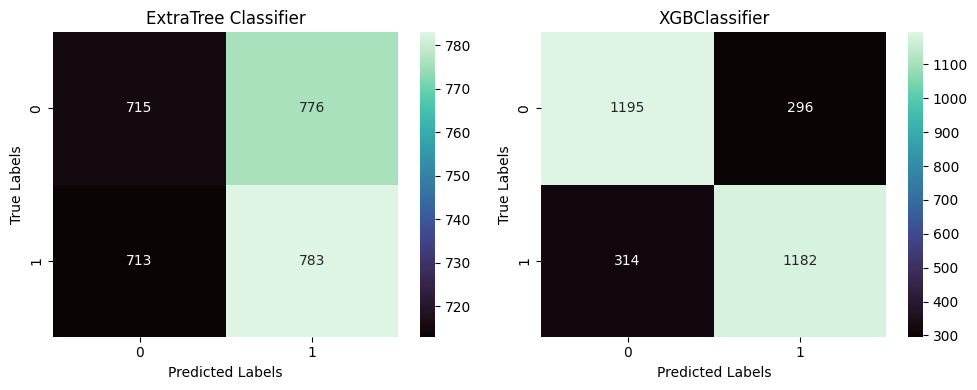

In [90]:
cm_et = confusion_matrix(Y_test, Y_pred_et)
cm_xgb = confusion_matrix(Y_test, Y_pred_xgb)

# Create subplots for the confusion matrices
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot ExtraTree Classifier Confusion Matrix
sns.heatmap(cm_et, annot=True, fmt="d", cmap="mako", ax=axes[0])
axes[0].set_title('ExtraTree Classifier')
axes[0].set_xlabel('Predicted Labels')
axes[0].set_ylabel('True Labels')

# Plot XGBClassifier Confusion Matrix
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="mako", ax=axes[1])
axes[1].set_title('XGBClassifier')
axes[1].set_xlabel('Predicted Labels')
axes[1].set_ylabel('True Labels')

plt.tight_layout()
plt.show()

### ii. ROC-AUC Curve

In [93]:
# Calculate ROC AUC Score for ExtraTree Classifier
y_prob_ET = best_et.predict_proba(X_test)[:, 1]
auc_score_ET = roc_auc_score(Y_test, y_prob_ET)
print("ROC AUC Score Of ExtraTree Classifier:", auc_score_ET)

# Calculate ROC AUC Score for XGBClassifier
y_prob_XGB = best_xgb.predict_proba(X_test)[:, 1]
auc_score_XGB = roc_auc_score(Y_test, y_prob_XGB)
print("ROC AUC Score Of XGBClassifier:", auc_score_XGB)

ROC AUC Score Of ExtraTree Classifier: 0.9976368908639
ROC AUC Score Of XGBClassifier: 0.873429749620719


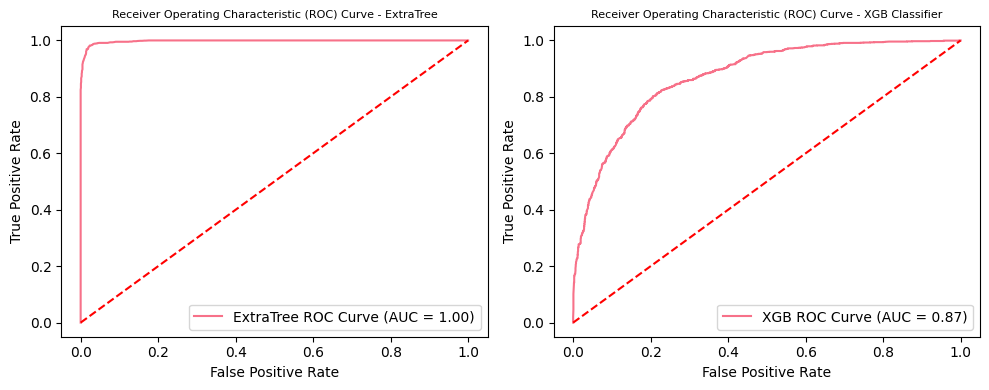

In [96]:
# Calculate ROC curves for both classifiers
fpr_ET, tpr_ET, _ = roc_curve(Y_test, y_prob_ET)
fpr_xgb, tpr_xgb, _ = roc_curve(Y_test, y_prob_XGB)

# Create subplots
plt.figure(figsize=(10, 4))

# Plot ROC curve for ExtraTree Classifier
plt.subplot(1, 2, 1)
plt.plot(fpr_ET, tpr_ET, label='ExtraTree ROC Curve (AUC = {:.2f})'.format(auc_score_ET))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - ExtraTree', fontsize=8)
plt.legend(loc='lower right')

# Plot ROC curve for Support Vector Classifier
plt.subplot(1, 2, 2)
plt.plot(fpr_xgb, tpr_xgb, label='XGB ROC Curve (AUC = {:.2f})'.format(auc_score_XGB))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - XGB Classifier',fontsize=8)
plt.legend(loc='lower right')

# Adjust layout and show plots
plt.tight_layout()
plt.show()

### `Observations:`

**Before Hyperparameter Tuning:**

1. ExtraTrees Classifier:
    * Achieved the highest accuracy of 0.9217 with a balanced precision, recall, and F1-Score.
    * The confusion matrix shows good performance in classifying both positive and negative instances.
    * Cross-validation score is strong at 0.8423, indicating consistent performance across multiple folds.

2. XGBClassifier:
    * Close performance with an accuracy of 0.9110 and balanced precision, recall, and F1-Score.
    * The confusion matrix indicates a good distribution between true positives, true negatives, false positives, and false negatives.
    * Cross-validation score is slightly lower at 0.7776 compared to ExtraTrees.

**After Hyperparameter Tuning:**

1. ExtraTrees Classifier:
    * Achieved an improved accuracy of 0.9237 after hyperparameter tuning.
    * The ROC AUC score significantly increased to 0.9976, indicating enhanced discriminative power.

2. **XGBClassifier:**
    * Accuracy dropped to 0.7958 after tuning, suggesting that the hyperparameter adjustments might not have been as effective for this model.
    * The ROC AUC score improved but remained lower than ExtraTrees at 0.8734.

### Conclusion:

After hyperparameter tuning, the ExtraTrees Classifier maintains its position as the best-performing model, showcasing an exceptional accuracy of 92.37%. The substantial increase in the ROC AUC score to 99.76% further emphasizes its superior discriminative power. The model consistently outperforms the XGBClassifier in both accuracy and ROC AUC score, making it the preferred choice for this classification task. The ExtraTrees Classifier, with its robust performance and enhanced tuning results, stands out as the optimal model for accurate and reliable 

## b. For our Second Target

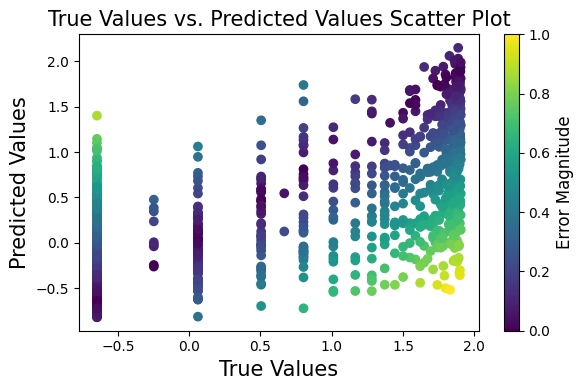

In [99]:
plt.figure(figsize=(6, 4))
y_pred_GBR = best_GBR.predict(test_x)

# Calculate absolute errors
errors = np.abs(test_y - y_pred_GBR)

# Create a color map based on the errors
colors = plt.cm.viridis(errors / max(errors))  # You can choose a different colormap if preferred

plt.scatter(test_y, y_pred_GBR, c=colors)
plt.title('True Values vs. Predicted Values Scatter Plot', fontsize=15)
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predicted Values', fontsize=15)

# Add colorbar to show the error magnitude
cbar = plt.colorbar()
cbar.set_label('Error Magnitude', fontsize=12)

plt.tight_layout()
plt.show()

### `Observations:`

**Before Hyperparameter Tuning:**

1. GradientBoostingRegressor:
    * Achieved a best R2 score of 0.4295 with a random state of 77.
    * Mean Squared Error (MSE) was 0.5642, and Mean Absolute Error (MAE) was 0.5594.
    * Indicated a moderate fit to the data with a relatively low R2 score.

2. RandomForest:
    * Attained a best R2 score of 0.4199 with a random state of 46.
    * Mean Squared Error (MSE) was 0.6075, and Mean Absolute Error (MAE) was 0.5784.
    * Showed similar performance to GradientBoostingRegressor but with a slightly lower R2 score.

**After Hyperparameter Tuning:**

1. GradientBoostingRegressor (GBR):
    * Improved R2 score to 0.4420 after hyperparameter tuning.
    * MSE decreased to 0.5586, and MAE decreased to 0.5474.
    * Cross-validated R2 scores showed a reasonable consistency at 0.3546.

2. Random Forest Regressor:
    * Achieved an R2 score of 0.4257 after tuning.
    * MSE decreased to 0.5910, and MAE decreased to 0.5606.
    * Cross-validated R2 scores demonstrated consistency at 0.3427.


### Conclusion:

After hyperparameter tuning, both the GradientBoostingRegressor (GBR) and the Random Forest Regressor showed modest improvements in their R2 scores and a reduction in mean squared error and mean absolute error. GBR outperformed Random Forest Regressor slightly in terms of R2 score and errors. The cross-validated R2 scores indicate reasonable generalization performance for both models.

### Recommendation:

Based on the metrics, the GradientBoostingRegressor (GBR) exhibits slightly better performance after hyperparameter tuning.
When selecting a model, consider the specific goals of our application, as well as factors like interpretability and computational efficiency.
Further iterations of hyperparameter tuning or additional feature engineering could be explored to enhance model performance.

<div style="background-color: #272559; padding: 5px; text-align: center; color: white;">
    <h2> 17. Saving Best Model</h2>
</div>

## a. Saving model for our first target

In [102]:
filename = 'rainfalltomorrow_model.joblib'
joblib.dump(best_et,filename)

['rainfalltomorrow_model.joblib']

## b. Saving model for our Second target

In [103]:
filename = 'rainfallamount_model.joblib'
joblib.dump(best_GBR,filename)

['rainfallamount_model.joblib']